In [2]:
import pandas as pd

## transaction


In [3]:
dateColumns = ['t_dat']
convertTable = dict()
convertTable['article_id'] = str
convertTable['sales_channel_id'] = str

ts = pd.read_csv ('transactions_train.csv', parse_dates=dateColumns, dtype = convertTable)
ts.head()

,t_dat,customer_id,article_id,price,sales_channel_id
0,2018-09-20,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,0663713001,0.050831,2
1,2018-09-20,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,0541518023,0.030492,2
2,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,0505221004,0.015237,2
3,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,0685687003,0.016932,2
4,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,0685687004,0.016932,2


In [4]:
ts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31788324 entries, 0 to 31788323
Data columns (total 5 columns):
 #   Column            Dtype         
---  ------            -----         
 0   t_dat             datetime64[ns]
 1   customer_id       object        
 2   article_id        object        
 3   price             float64       
 4   sales_channel_id  object        
dtypes: datetime64[ns](1), float64(1), object(3)
memory usage: 1.2+ GB


In [5]:
# Calculate the percentage of missing values 
missing_values = ts.isnull().sum()
missing_values_percentage = 100 * missing_values / len(ts)
missing_values_table = pd.concat([missing_values, missing_values_percentage], axis=1)
missing_values_table = missing_values_table.rename(columns = {0 : 'Missing Values', 1 : '% of Missing Values'})
missing_values_table = missing_values_table[missing_values_table.iloc[:,0] != 0].sort_values('% of Missing Values', ascending=False).round(1)
missing_values_table

,Missing Values,% of Missing Values


## Article

In [6]:
convertTable = dict()
convertTable['article_id'] = str
convertTable['product_code'] = str
convertTable['product_type_no'] = str
convertTable['graphical_appearance_no'] = str
convertTable['colour_group_code'] = str
convertTable['perceived_colour_value_id'] = str
convertTable['perceived_colour_master_id'] = str
convertTable['department_no'] = str
convertTable['index_group_no'] = str
convertTable['section_no'] = str
convertTable['garment_group_no'] = str
at = pd.read_csv ('articles.csv', dtype = convertTable)
at.head()

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,department_name,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc
0,0108775015,0108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,09,Black,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
1,0108775044,0108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,10,White,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
2,0108775051,0108775,Strap top (1),253,Vest top,Garment Upper body,1010017,Stripe,11,Off White,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
3,0110065001,0110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,09,Black,...,Clean Lingerie,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde..."
4,0110065002,0110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,10,White,...,Clean Lingerie,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde..."


In [7]:
at.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105542 entries, 0 to 105541
Data columns (total 25 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   article_id                    105542 non-null  object
 1   product_code                  105542 non-null  object
 2   prod_name                     105542 non-null  object
 3   product_type_no               105542 non-null  object
 4   product_type_name             105542 non-null  object
 5   product_group_name            105542 non-null  object
 6   graphical_appearance_no       105542 non-null  object
 7   graphical_appearance_name     105542 non-null  object
 8   colour_group_code             105542 non-null  object
 9   colour_group_name             105542 non-null  object
 10  perceived_colour_value_id     105542 non-null  object
 11  perceived_colour_value_name   105542 non-null  object
 12  perceived_colour_master_id    105542 non-null  object
 13 

In [8]:
# Calculate the percentage of missing values 
missing_values = at.isnull().sum()
missing_values_percentage = 100 * missing_values / len(at)
missing_values_table = pd.concat([missing_values, missing_values_percentage], axis=1)
missing_values_table = missing_values_table.rename(columns = {0 : 'Missing Values', 1 : '% of Missing Values'})
missing_values_table = missing_values_table[missing_values_table.iloc[:,0] != 0].sort_values('% of Missing Values', ascending=False).round(1)
missing_values_table

,Missing Values,% of Missing Values
detail_desc,416,0.4


In [9]:
print(len(at[at.isnull().any(axis=1)].index))

416


แสดงว่า 416 แถวที่หายไปก็อยู่ใน col นั้นหมดเลย อาจเลี่ยงโดยการไม่พิจารณา column detail_desc

In [10]:
print(len(set(at['prod_name'])))
print(set(at['prod_name']))

45875
{'Fagan SS', 'Robert slipon PU BB', 'Linn 5p Cotton Hipster', 'ALBA Fur Bolero', 'Finland Hood', '2p OP Brazilian Low (Acacia)', 'TC Deco patches Love kit', 'Lisbon Dress', 'WM price tee', 'Selma sporty dress j', 'SPEC OCC PUTTE', 'Jets dress', 'POLLY daycare dress - TVP', 'Scar Fancy', 'Boulevard Knot Tee', 'SW Noa UV suit', 'DAGMAR dress', 'Harajuku', 'Kate Skatedress Rib', 'Fiona Ch Hipster(Poppy)4pk', 'Iris HW super wide', '1 pk sportsock', 'FLORIDA tights', 'TD check Parker', 'CTH Beach Swimsuit', 'K YORKIE CNY', 'PE VALERIE', 'Dress Prairie', 'PE PRINGLE RIB KNIT', 'MOMO cropt top', 'Buffy fleece', 'Beach Towel', 'Dina Fingerless Glove', 'DIV Stockholm parka', 'Bruno Jaquard set', 'Vincent Embellished Trouser', 'Peggy polo', 'Fancy tights 2p OL', 'ANGELINA LACE DRESS', 'Dorset SPEED dress', 'Bianca LS top', 'Pernilla shirt', 'Phoenix LS hood', 'KNOT hairband', 'LIA armband', 'PQ KULA SILK TOP', 'Fredrik 5P LS tee', 'Dragomir Jacket', 'MICHI Lee resort shirt', 'PQ CELIA WOOL

In [11]:

print(len(set(at['product_type_name'])))
print(set(at['product_type_name']))

131
{'Sweater', 'Bikini top', 'Swimsuit', 'Robe', 'Other accessories', 'Wedge', 'Shoulder bag', 'Cross-body bag', 'Stain remover spray', 'Waterbottle', 'Hoodie', 'Keychain', 'Toy', 'Swimwear set', 'Dungarees', 'Underwear set', 'Backpack', 'Dog wear', 'Pyjama bottom', 'Underwear body', 'Sleeping sack', 'Sunglasses', 'Other shoe', 'Belt', 'Night gown', 'Swimwear top', 'Mobile case', 'Blazer', 'Top', 'Soft Toys', 'Hat/beanie', 'Shorts', 'Cardigan', 'Gloves', 'Outdoor Waistcoat', 'Cushion', 'Bracelet', 'T-shirt', 'Kids Underwear top', 'Bag', 'Braces', 'Nipple covers', 'Blouse', 'Side table', 'Alice band', 'Pumps', 'Coat', 'Marker pen', 'Towel', 'Ring', 'Bucket hat', 'Garment Set', 'Eyeglasses', 'Earring', 'Outdoor overall', 'Leggings/Tights', 'Hair ties', 'Tie', 'Costumes', 'Headband', 'Accessories set', 'Sewing kit', 'Wallet', 'Jacket', 'Heeled sandals', 'Outdoor trousers', 'Leg warmers', 'Blanket', 'Necklace', 'Sneakers', 'Dress', 'Hair/alice band', 'Bootie', 'Tailored Waistcoat', 'Jumps

In [12]:
print(len(set(at['product_group_name'])))
print(set(at['product_group_name']))

19
{'Garment Lower body', 'Underwear', 'Swimwear', 'Garment Upper body', 'Garment and Shoe care', 'Nightwear', 'Cosmetic', 'Bags', 'Items', 'Socks & Tights', 'Stationery', 'Furniture', 'Underwear/nightwear', 'Garment Full body', 'Unknown', 'Shoes', 'Fun', 'Interior textile', 'Accessories'}


In [13]:
print(len(set(at['colour_group_name'])))
print(set(at['colour_group_name']))

50
{'Other Pink', 'Gold', 'Turquoise', 'Dark Blue', 'Beige', 'Dark Orange', 'Other Orange', 'Light Red', 'Greyish Beige', 'Other', 'Greenish Khaki', 'Dark Grey', 'Other Blue', 'Pink', 'Red', 'Light Green', 'Yellowish Brown', 'Off White', 'Light Yellow', 'Dark Yellow', 'Light Orange', 'Light Purple', 'Light Grey', 'Transparent', 'Other Yellow', 'Bronze/Copper', 'Blue', 'Silver', 'Orange', 'Other Green', 'Dark Pink', 'Dark Purple', 'Dark Turquoise', 'Green', 'Dark Beige', 'Light Beige', 'Light Turquoise', 'Unknown', 'Dark Red', 'White', 'Other Turquoise', 'Black', 'Light Blue', 'Other Red', 'Grey', 'Yellow', 'Light Pink', 'Purple', 'Other Purple', 'Dark Green'}


In [14]:
tsat = pd.merge(left=ts[['t_dat','article_id','sales_channel_id','price']],
                right = at[['article_id','prod_name','product_type_name','product_group_name','colour_group_name']],
                how = 'left' ,
                left_on = 'article_id',
                right_on = 'article_id'
                )

# tsat = dfCusSales.drop(columns=['Customer ID','ID'])
tsat.head()

,t_dat,article_id,sales_channel_id,price,prod_name,product_type_name,product_group_name,colour_group_name
0,2018-09-20,0663713001,2,0.050831,Atlanta Push Body Harlow,Underwear body,Underwear,Black
1,2018-09-20,0541518023,2,0.030492,Rae Push (Melbourne) 2p,Bra,Underwear,Light Pink
2,2018-09-20,0505221004,2,0.015237,Inca Jumper,Sweater,Garment Upper body,Pink
3,2018-09-20,0685687003,2,0.016932,W YODA KNIT OL OFFER,Sweater,Garment Upper body,Pink
4,2018-09-20,0685687004,2,0.016932,W YODA KNIT OL OFFER,Sweater,Garment Upper body,Dark Green


In [15]:
tsat['year'] = tsat['t_dat'].dt.year
tsat['month'] = tsat['t_dat'].dt.month
tsat['day'] = tsat['t_dat'].dt.day

In [16]:
set(tsat['year'])

{2018, 2019, 2020}

In [17]:
tsat.head()

,t_dat,article_id,sales_channel_id,price,prod_name,product_type_name,product_group_name,colour_group_name,year,month,day
0,2018-09-20,0663713001,2,0.050831,Atlanta Push Body Harlow,Underwear body,Underwear,Black,2018,9,20
1,2018-09-20,0541518023,2,0.030492,Rae Push (Melbourne) 2p,Bra,Underwear,Light Pink,2018,9,20
2,2018-09-20,0505221004,2,0.015237,Inca Jumper,Sweater,Garment Upper body,Pink,2018,9,20
3,2018-09-20,0685687003,2,0.016932,W YODA KNIT OL OFFER,Sweater,Garment Upper body,Pink,2018,9,20
4,2018-09-20,0685687004,2,0.016932,W YODA KNIT OL OFFER,Sweater,Garment Upper body,Dark Green,2018,9,20


In [18]:
# เรียก prod_name มาดูว่าผลิตเป็น season หรือ ทั้งปี
set(tsat['t_dat'].loc[tsat['prod_name'] == 'Rae Push (Melbourne) 2p'])

{Timestamp('2018-09-20 00:00:00'),
 Timestamp('2018-09-21 00:00:00'),
 Timestamp('2018-09-22 00:00:00'),
 Timestamp('2018-09-23 00:00:00'),
 Timestamp('2018-09-24 00:00:00'),
 Timestamp('2018-09-25 00:00:00'),
 Timestamp('2018-09-26 00:00:00'),
 Timestamp('2018-09-27 00:00:00'),
 Timestamp('2018-09-28 00:00:00'),
 Timestamp('2018-09-29 00:00:00'),
 Timestamp('2018-09-30 00:00:00'),
 Timestamp('2018-10-01 00:00:00'),
 Timestamp('2018-10-02 00:00:00'),
 Timestamp('2018-10-03 00:00:00'),
 Timestamp('2018-10-04 00:00:00'),
 Timestamp('2018-10-05 00:00:00'),
 Timestamp('2018-10-06 00:00:00'),
 Timestamp('2018-10-07 00:00:00'),
 Timestamp('2018-10-08 00:00:00'),
 Timestamp('2018-10-09 00:00:00'),
 Timestamp('2018-10-10 00:00:00'),
 Timestamp('2018-10-11 00:00:00'),
 Timestamp('2018-10-12 00:00:00'),
 Timestamp('2018-10-13 00:00:00'),
 Timestamp('2018-10-14 00:00:00'),
 Timestamp('2018-10-15 00:00:00'),
 Timestamp('2018-10-16 00:00:00'),
 Timestamp('2018-10-17 00:00:00'),
 Timestamp('2018-10-

In [19]:
# เรียก prod_name มาดูว่าผลิตเป็น season หรือ ทั้งปี
set(tsat['t_dat'].loc[tsat['prod_name'] == 'Kiwi biker'])

{Timestamp('2018-12-16 00:00:00'),
 Timestamp('2019-01-07 00:00:00'),
 Timestamp('2019-01-20 00:00:00'),
 Timestamp('2019-01-24 00:00:00'),
 Timestamp('2019-01-27 00:00:00'),
 Timestamp('2019-01-28 00:00:00'),
 Timestamp('2019-01-29 00:00:00'),
 Timestamp('2019-01-30 00:00:00'),
 Timestamp('2019-03-12 00:00:00'),
 Timestamp('2019-03-23 00:00:00'),
 Timestamp('2019-03-25 00:00:00'),
 Timestamp('2019-04-06 00:00:00'),
 Timestamp('2019-04-17 00:00:00'),
 Timestamp('2019-04-21 00:00:00'),
 Timestamp('2019-04-23 00:00:00'),
 Timestamp('2019-05-02 00:00:00'),
 Timestamp('2019-05-10 00:00:00'),
 Timestamp('2019-05-14 00:00:00'),
 Timestamp('2019-05-23 00:00:00'),
 Timestamp('2019-05-30 00:00:00'),
 Timestamp('2019-06-08 00:00:00'),
 Timestamp('2019-06-11 00:00:00'),
 Timestamp('2019-08-13 00:00:00'),
 Timestamp('2019-08-16 00:00:00'),
 Timestamp('2019-08-24 00:00:00'),
 Timestamp('2019-09-01 00:00:00'),
 Timestamp('2019-09-08 00:00:00'),
 Timestamp('2019-09-11 00:00:00'),
 Timestamp('2019-09-

In [20]:
# เรียก prod_name มาดูว่าผลิตเป็น season หรือ ทั้งปี
set(tsat['t_dat'].loc[tsat['prod_name'] == '2-P Amelia'])

{Timestamp('2020-08-22 00:00:00'),
 Timestamp('2020-09-17 00:00:00'),
 Timestamp('2020-09-22 00:00:00')}

In [21]:
# เรียก prod_name มาดูว่าผลิตเป็น season หรือ ทั้งปี
set(tsat['t_dat'].loc[tsat['prod_name'] == 'Flirty Earl hoop pk'])

{Timestamp('2019-04-22 00:00:00'),
 Timestamp('2019-04-23 00:00:00'),
 Timestamp('2019-04-24 00:00:00'),
 Timestamp('2019-04-25 00:00:00'),
 Timestamp('2019-04-26 00:00:00'),
 Timestamp('2019-04-27 00:00:00'),
 Timestamp('2019-04-28 00:00:00'),
 Timestamp('2019-04-29 00:00:00'),
 Timestamp('2019-04-30 00:00:00'),
 Timestamp('2019-05-01 00:00:00'),
 Timestamp('2019-05-04 00:00:00'),
 Timestamp('2019-05-07 00:00:00'),
 Timestamp('2019-05-14 00:00:00'),
 Timestamp('2019-05-17 00:00:00'),
 Timestamp('2019-05-21 00:00:00'),
 Timestamp('2019-05-29 00:00:00'),
 Timestamp('2019-06-06 00:00:00'),
 Timestamp('2019-06-07 00:00:00'),
 Timestamp('2019-08-23 00:00:00'),
 Timestamp('2019-08-24 00:00:00'),
 Timestamp('2019-08-25 00:00:00'),
 Timestamp('2019-08-26 00:00:00'),
 Timestamp('2019-08-27 00:00:00'),
 Timestamp('2019-08-28 00:00:00'),
 Timestamp('2019-08-29 00:00:00'),
 Timestamp('2019-08-30 00:00:00'),
 Timestamp('2019-08-31 00:00:00'),
 Timestamp('2019-09-01 00:00:00'),
 Timestamp('2019-09-

In [22]:
# เรียก prod_name มาดูว่าผลิตเป็น season หรือ ทั้งปี
set(tsat['t_dat'].loc[tsat['prod_name'] == 'PE Corres Tee 2'])

{Timestamp('2018-10-13 00:00:00'),
 Timestamp('2018-10-14 00:00:00'),
 Timestamp('2018-10-15 00:00:00'),
 Timestamp('2018-12-05 00:00:00'),
 Timestamp('2018-12-15 00:00:00'),
 Timestamp('2018-12-19 00:00:00'),
 Timestamp('2019-05-01 00:00:00'),
 Timestamp('2019-06-04 00:00:00'),
 Timestamp('2019-07-01 00:00:00')}

In [23]:
# ถ้าลองเรียกเป็น type
# เรียก prod_name มาดูว่าผลิตเป็น season หรือ ทั้งปี
set(tsat['t_dat'].loc[tsat['product_type_name'] == 'Trousers'])

{Timestamp('2018-09-20 00:00:00'),
 Timestamp('2018-09-21 00:00:00'),
 Timestamp('2018-09-22 00:00:00'),
 Timestamp('2018-09-23 00:00:00'),
 Timestamp('2018-09-24 00:00:00'),
 Timestamp('2018-09-25 00:00:00'),
 Timestamp('2018-09-26 00:00:00'),
 Timestamp('2018-09-27 00:00:00'),
 Timestamp('2018-09-28 00:00:00'),
 Timestamp('2018-09-29 00:00:00'),
 Timestamp('2018-09-30 00:00:00'),
 Timestamp('2018-10-01 00:00:00'),
 Timestamp('2018-10-02 00:00:00'),
 Timestamp('2018-10-03 00:00:00'),
 Timestamp('2018-10-04 00:00:00'),
 Timestamp('2018-10-05 00:00:00'),
 Timestamp('2018-10-06 00:00:00'),
 Timestamp('2018-10-07 00:00:00'),
 Timestamp('2018-10-08 00:00:00'),
 Timestamp('2018-10-09 00:00:00'),
 Timestamp('2018-10-10 00:00:00'),
 Timestamp('2018-10-11 00:00:00'),
 Timestamp('2018-10-12 00:00:00'),
 Timestamp('2018-10-13 00:00:00'),
 Timestamp('2018-10-14 00:00:00'),
 Timestamp('2018-10-15 00:00:00'),
 Timestamp('2018-10-16 00:00:00'),
 Timestamp('2018-10-17 00:00:00'),
 Timestamp('2018-10-

In [24]:
tsat.groupby(by=['year','month']).agg({'article_id': 'count'})

article_id
year month            
2018 9          594776
     10        1397040
     11        1270619
     12        1148827
2019 1         1263471
     2         1152412
     3         1286750
     4         1476454
     5         1560319
     6         1906202
     7         1807494
     8         1253530
     9         1227178
     10        1146772
     11        1198033
     12        1118315
2020 1         1076354
     2         1001859
     3         1047752
     4         1340882
     5         1361815
     6         1764507
     7         1351502
     8         1237192
     9          798269

In [25]:
tsat_n = tsat.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
tsat_n = tsat_n.reset_index()
tsat_n = tsat_n.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
tsat_n

,year,month,article_id,items_count,income
0,2018,9,0108775015,662,5.313373
1,2018,9,0108775044,283,2.258983
2,2018,9,0108775051,59,0.297610
3,2018,9,0110065001,69,1.651119
4,2018,9,0110065002,27,0.644915
...,...,...,...,...,...
768878,2020,9,0952267001,39,0.587169
768879,2020,9,0952938001,9,0.432051
768880,2020,9,0953450001,17,0.286220
768881,2020,9,0953763001,35,0.766780


In [26]:
tsat_nn = pd.merge(left=tsat_n[['year','month','article_id','items_count','income']],
                right = at[['article_id','product_type_name','product_group_name','colour_group_name']],
                how = 'left' ,
                left_on = 'article_id',
                right_on = 'article_id'
                )

# tsat = dfCusSales.drop(columns=['Customer ID','ID'])
tsat_nn.head()

,year,month,article_id,items_count,income,product_type_name,product_group_name,colour_group_name
0,2018,9,0108775015,662,5.313373,Vest top,Garment Upper body,Black
1,2018,9,0108775044,283,2.258983,Vest top,Garment Upper body,White
2,2018,9,0108775051,59,0.297610,Vest top,Garment Upper body,Off White
3,2018,9,0110065001,69,1.651119,Bra,Underwear,Black
4,2018,9,0110065002,27,0.644915,Bra,Underwear,White


In [27]:
tsat_nn = tsat_nn.drop(tsat_nn[(tsat_nn['year']==2018) & (tsat_nn['month']==9)].index)
tsat_nn

,year,month,article_id,items_count,income,product_type_name,product_group_name,colour_group_name
25698,2018,10,0108775015,1532,12.380746,Vest top,Garment Upper body,Black
25699,2018,10,0108775044,617,4.979034,Vest top,Garment Upper body,White
25700,2018,10,0108775051,134,0.659237,Vest top,Garment Upper body,Off White
25701,2018,10,0110065001,171,4.025746,Bra,Underwear,Black
25702,2018,10,0110065002,70,1.628678,Bra,Underwear,White
...,...,...,...,...,...,...,...,...
768878,2020,9,0952267001,39,0.587169,Underwear Tights,Socks & Tights,Black
768879,2020,9,0952938001,9,0.432051,Top,Garment Upper body,Beige
768880,2020,9,0953450001,17,0.286220,Socks,Socks & Tights,Black
768881,2020,9,0953763001,35,0.766780,Vest top,Garment Upper body,Black


In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

<AxesSubplot:xlabel='month', ylabel='product_group_name'>

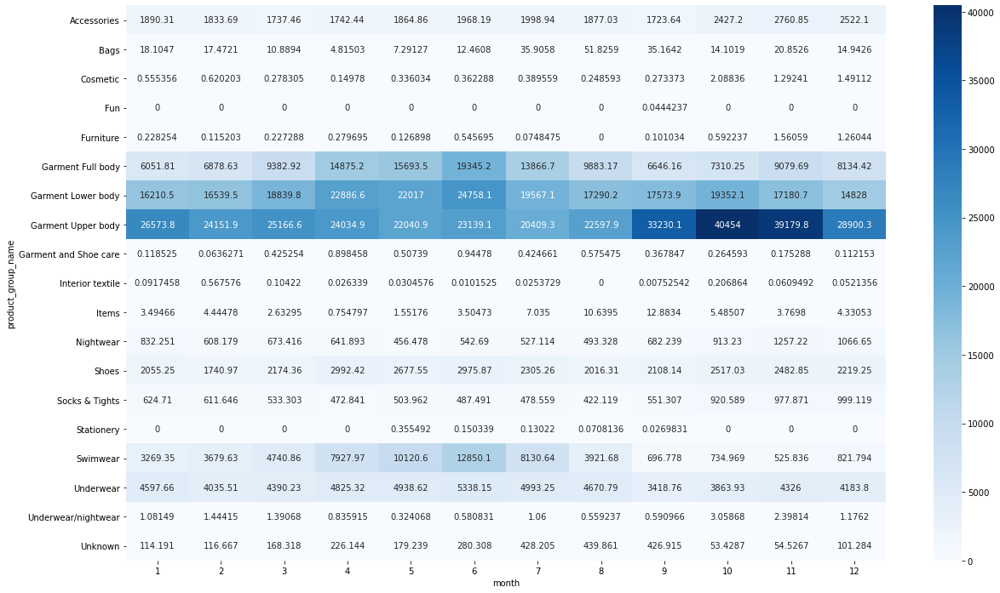

In [29]:
prog_mo = pd.pivot_table(tsat_nn, values='income', index=['product_group_name'], columns=['month'], fill_value=0, aggfunc=np.sum)

plt.figure(figsize=(20, 12))
sns.heatmap(prog_mo, annot=True, fmt='g', cmap='Blues')

<AxesSubplot:xlabel='month', ylabel='product_group_name'>

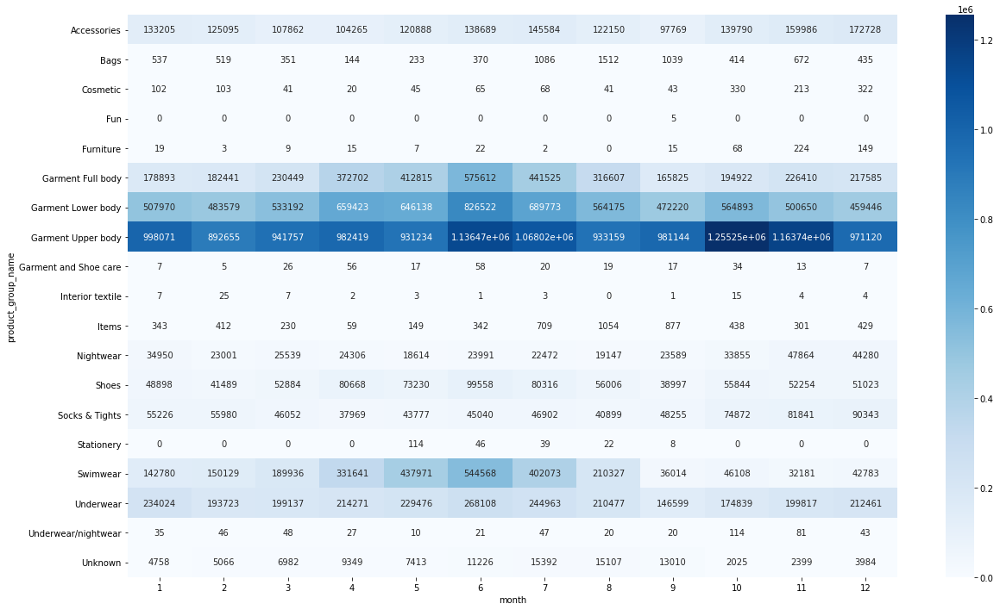

In [30]:
prog_mo = pd.pivot_table(tsat_nn, values='items_count', index=['product_group_name'], columns=['month'], fill_value=0, aggfunc=np.sum)

plt.figure(figsize=(20, 12))
sns.heatmap(prog_mo, annot=True, fmt='g', cmap='Blues')

<AxesSubplot:xlabel='month', ylabel='product_type_name'>

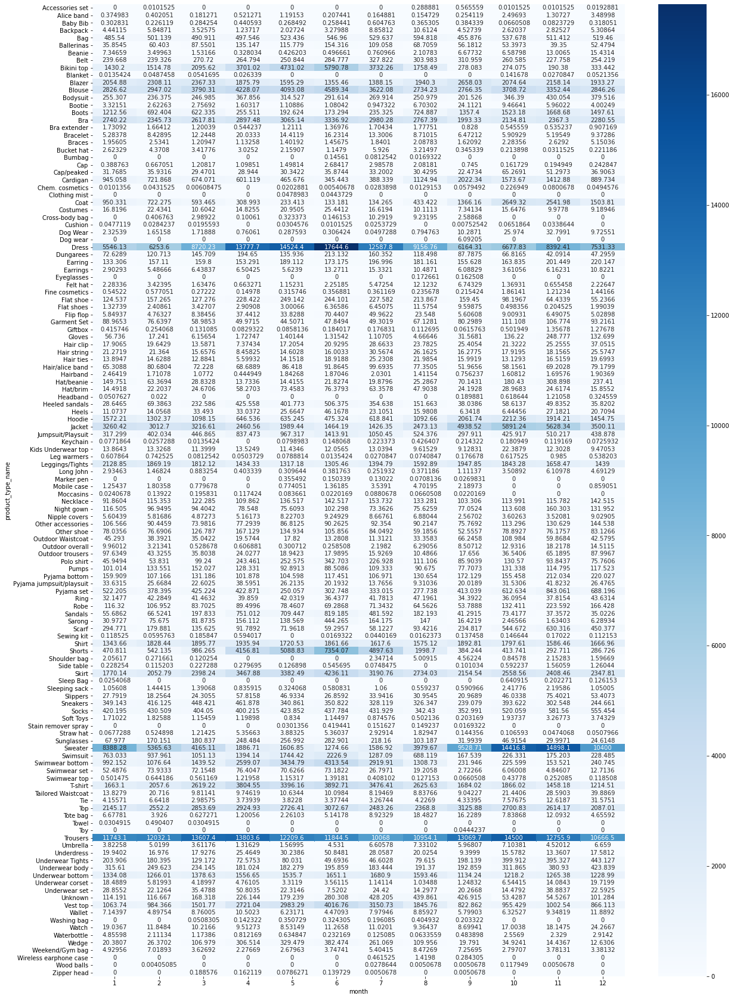

In [31]:
prot_mo_price = pd.pivot_table(tsat_nn, values='income', index=['product_type_name'], columns=['month'], fill_value=0, aggfunc=np.sum)

plt.figure(figsize=(20, 30))
sns.heatmap(prot_mo_price, annot=True, fmt='g', cmap='Blues')

In [32]:
highest_income = prot_mo_price.copy()
highest_income.loc[:,'Row_Total']=highest_income.sum(numeric_only=True, axis=1)
highest_income= highest_income.sort_values(by=['Row_Total'],ascending=False)
highest_income.head(10)

month,1,2,3,4,5,6,7,8,9,10,11,12,Row_Total
product_type_name,,,,,,,,,,,,,
Trousers,11743.086390,12032.114525,13607.414153,13803.572169,12209.559356,11844.519508,10068.021017,10954.095085,13069.650322,14499.982237,12755.864576,10666.508525,147254.387864
Dress,5546.132424,6253.598288,8720.227966,13777.666220,14524.444017,17644.607186,12587.788237,9156.761508,6164.312322,6677.829186,8392.412068,7531.334000,116977.113424
Sweater,8388.283593,5365.626051,4165.108441,1886.710407,1606.846983,1274.663593,1586.915678,3979.673746,9528.709678,14416.770237,14898.082525,10399.994203,77497.385136
Blouse,2826.616898,2947.022644,3790.308492,4228.065254,4093.075237,4589.341356,3622.082695,2734.229407,2766.352932,3708.720983,3352.440763,2846.263542,41504.520203
Jacket,3260.419525,3012.701203,3216.608390,2460.556305,1989.439915,1464.192983,1426.354864,2473.125068,4938.515492,5891.235305,5628.344169,3500.112356,39261.605576
Skirt,1770.141000,2052.785237,2398.241288,3467.881932,3382.487169,4236.105441,3190.761746,2734.031915,2154.539542,2558.558136,2408.456322,2347.812407,32701.802136
Top,2145.171203,2552.201237,2853.689864,2924.934542,2726.414339,3072.673407,2483.259407,2368.804322,3125.883441,2700.825576,2614.165712,2087.009949,31655.033000
Bra,2740.224220,2345.725932,2617.807763,2897.475525,3065.135932,3336.920864,2980.284186,2767.394983,1993.327915,2134.812695,2367.295254,2280.551492,31526.956763
T-shirt,1663.097797,2057.597644,2619.215881,3804.554407,3396.160034,3892.714492,3476.410102,2625.627915,1684.023593,1866.020441,1458.184881,1214.507525,29758.114712


<AxesSubplot:xlabel='month', ylabel='product_type_name'>

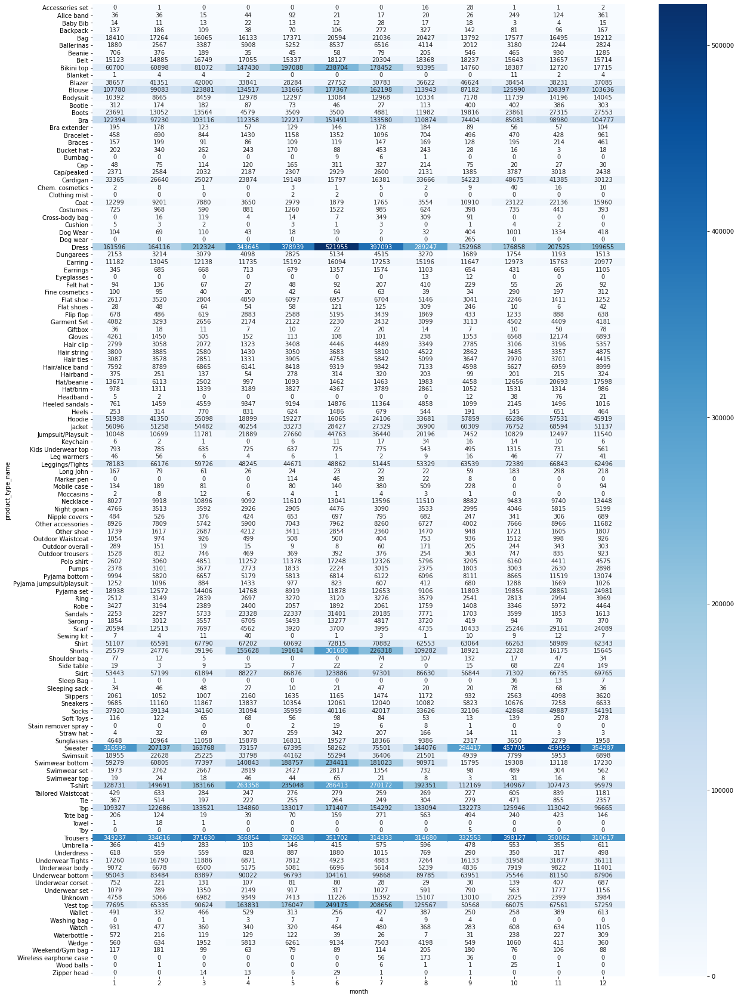

In [33]:
prot_mo_q = pd.pivot_table(tsat_nn, values='items_count', index=['product_type_name'], columns=['month'], fill_value=0, aggfunc=np.sum)

plt.figure(figsize=(20, 30))
sns.heatmap(prot_mo_q, annot=True, fmt='g', cmap='Blues')

In [34]:
highest_quanitems = prot_mo_q.copy()
highest_quanitems.loc[:,'Row_Total']=highest_quanitems.sum(numeric_only=True, axis=1)
highest_quanitems= highest_quanitems.sort_values(by=['Row_Total'],ascending=False)
highest_quanitems.head(10)

month,1,2,3,4,5,6,7,8,9,10,11,12,Row_Total
product_type_name,,,,,,,,,,,,,
Trousers,349237,334616,371630,366854,322608,351702,314333,314680,332553,398127,350062,310617,4117019
Dress,161596,164116,212324,343645,378939,521955,397093,289247,152968,176858,207525,199655,3205921
Sweater,316599,207137,163768,73157,67395,58262,75501,144076,294417,457705,459959,354287,2672263
T-shirt,128731,149691,183166,263358,235048,286413,270172,192351,112169,140967,107473,95979,2165518
Top,109327,122686,133521,134860,133017,171407,154292,133094,132273,125946,113042,96665,1560130
Blouse,107780,99083,123881,134517,131665,177367,162198,113943,87182,125990,108397,103636,1475639
Vest top,77695,65335,90624,163831,176047,249175,208656,125567,50568,66075,67561,57259,1398393
Bra,122394,97230,103116,112358,122217,151491,133580,110874,74404,85081,98980,104777,1316502
Shorts,25579,24776,39196,155628,191614,301680,226318,109282,18921,22328,16175,15645,1147142


In [35]:
#สำหรับ type อันนี้ใช้ใน model ห้ามลบ
dt_time =tsat.copy()
# dt_time_2018 = dt_time[dt_time['year']==2018]
# dt_time
prodt_ts =  dt_time.groupby(by=['t_dat','product_type_name']).agg({'article_id': 'count'})
# prodt_ts = prodt_ts.reset_index()
prodt_ts
# time_ts.pivot_tale('article_id', index=['t_dat'],columns='product_type_name')

article_id
t_dat      product_type_name            
2018-09-20 Bag                       377
           Ballerinas                 82
           Belt                      244
           Bikini top                535
           Blazer                    684
...                                  ...
2020-09-22 Wallet                      2
           Watch                       5
           Waterbottle                 1
           Wedge                      10
           Weekend/Gym bag             2

[68558 rows x 1 columns]

In [108]:
#สำหรับ group อันนี้ใช้ใน model ห้ามลบ
# dt_time =tsat.copy()
# prodg_ts =  dt_time.groupby(by=['t_dat','product_group_name']).agg({'article_id': 'count'})
# prodg_ts

In [23]:
import plotly.express as px
time_prot_plot = prodt_ts.copy()
time_prot_plot = time_prot_plot.reset_index()
time_prot_plot['article_id'] = time_prot_plot['article_id'].rolling(1200).mean()

fig = px.line(time_prot_plot, x="t_dat", y="article_id", color='product_type_name', width =900,height=700)
fig.show()


# Machine learning for store damand forecasting

In [119]:
!pip install xgboost

You should consider upgrading via the 'c:\users\kornc\documents\anaconda3\python.exe -m pip install --upgrade pip' command.


In [25]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error

## (I) using XGBoost

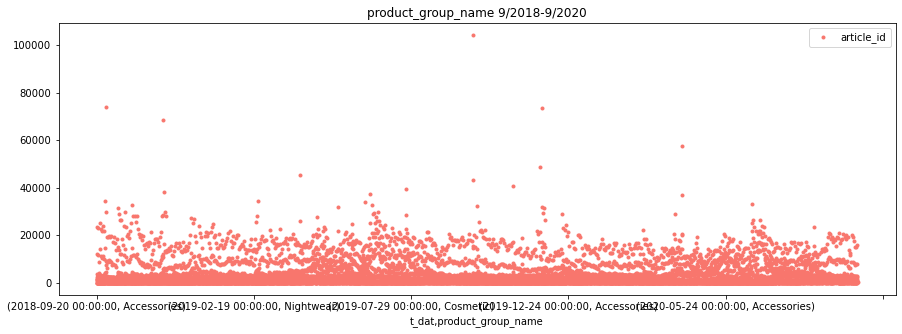

In [26]:
color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
_ = prodg_ts.plot(style='.', figsize=(15,5), color=color_pal[0], title='product_group_name 9/2018-9/2020')

In [27]:
prodg_ts.head()

article_id
t_dat      product_group_name            
2018-09-20 Accessories               2194
           Bags                         1
           Cosmetic                     6
           Garment Full body         3600
           Garment Lower body       11868

# Accessories

### train/test split ใช้ Feb to Sep 2020 เป็น test

In [138]:
split_date = '2020-01-31'
prog_time = prodg_ts.copy()
prog_time = prog_time.reset_index()
prog_Acc = prog_time[prog_time['product_group_name']=='Accessories']
prog_Acc = prog_Acc.set_index('t_dat')
prog_Acc = prog_Acc.drop(['product_group_name'], axis=1)
prog_Acc_train = prog_Acc.loc[prog_Acc.index <= split_date].copy()
prog_Acc_test = prog_Acc.loc[prog_Acc.index > split_date].copy()

In [139]:
prog_Acc_test.head()

,article_id
t_dat,
2020-02-01,2527
2020-02-02,1619
2020-02-03,1574
2020-02-04,1575
2020-02-05,2026


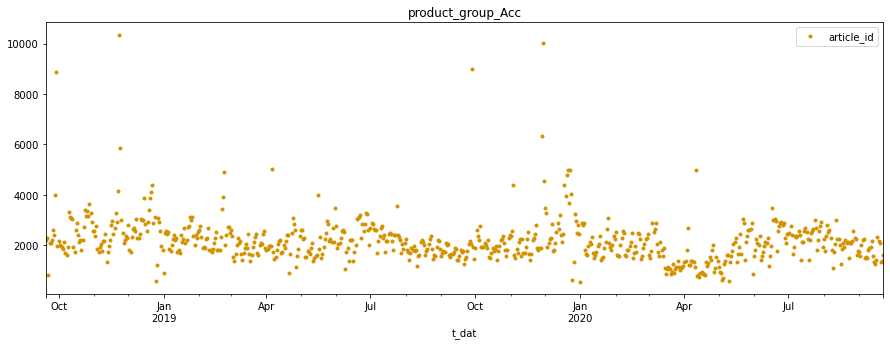

In [140]:
color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
_ = prog_Acc.plot(style='.', figsize=(15,5), color=color_pal[1], title='product_group_Acc')

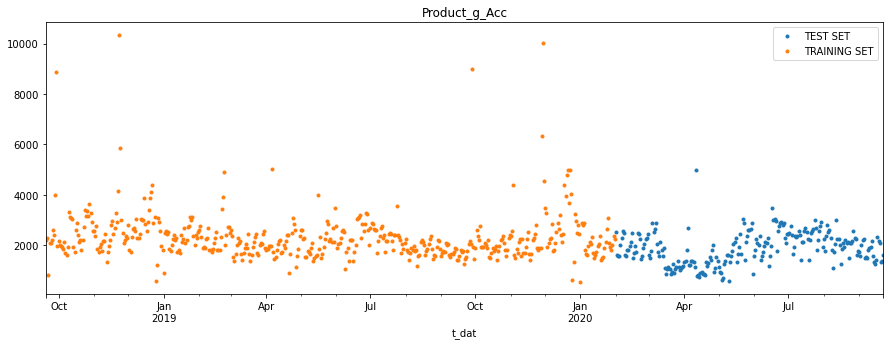

In [141]:
_ = prog_Acc_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prog_Acc_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_g_Acc', style='.')

### Create Time Series Features

In [120]:
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [143]:
create_features(df=prog_Acc_test, label=None)

<ipython-input-142-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


In [144]:
X_train, y_train = create_features(prog_Acc_train, label='article_id')
X_test, y_test = create_features(prog_Acc_test, label='article_id')

<ipython-input-142-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



### Create XGBoost Model

In [73]:
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=30, n_jobs=16,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

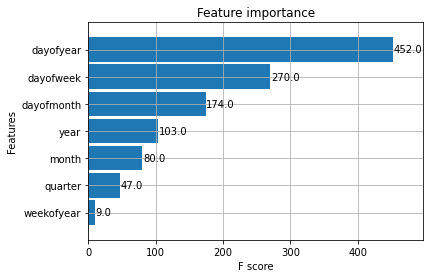

In [74]:
_ = plot_importance(reg, height=0.9)

### Forecast on Test Set

In [75]:
prog_Acc_test['Accs_Prediction'] = reg.predict(X_test)
progAcc_all = pd.concat([prog_Acc_test, prog_Acc_train], sort=False)

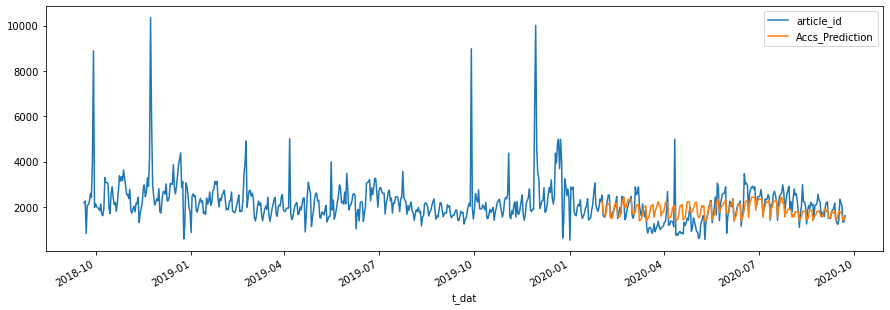

In [76]:
_ = progAcc_all[['article_id','Accs_Prediction']].plot(figsize=(15, 5))

### Look at first month of predictions

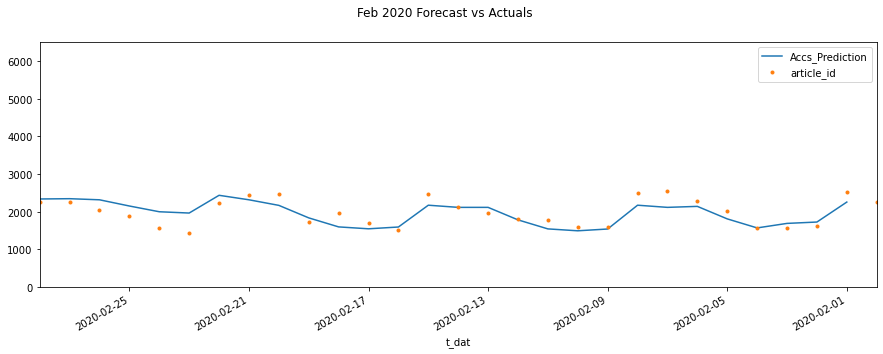

In [77]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

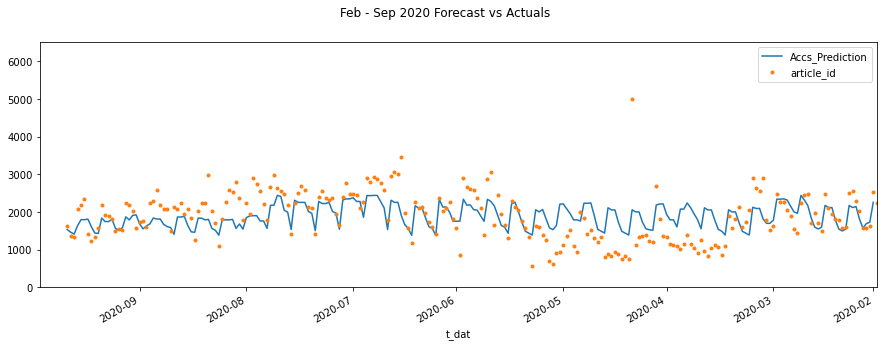

In [78]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

### Error Metrics On Test Set

In [79]:
mean_squared_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

296269.6146234011

In [80]:
mean_absolute_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

411.4782200590093

In [81]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [82]:
mean_absolute_percentage_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

27.121733047278774

### Look at Worst and Best Predicted Days

In [83]:
prog_Acc_test['error'] = prog_Acc_test['article_id'] - prog_Acc_test['Accs_Prediction']
prog_Acc_test['abs_error'] = prog_Acc_test['error'].apply(np.abs)
error_by_day = prog_Acc_test.groupby(['year','month','dayofmonth']) \
    .mean()[['article_id','Accs_Prediction','error','abs_error']]

In [84]:
# Over forecasted days
error_by_day.sort_values('error', ascending=True).head(10)

article_id  Accs_Prediction        error    abs_error
year month dayofmonth                                                       
2020 5     2                925.0      2207.843994 -1282.843994  1282.843994
     4     18               875.0      2111.707031 -1236.707031  1236.707031
           17               842.0      2054.464355 -1212.464355  1212.464355
     3     20               843.0      2054.464355 -1211.464355  1211.464355
           21               957.0      2111.707031 -1154.707031  1154.707031
     4     16               931.0      2054.464355 -1123.464355  1123.464355
     5     1               1134.0      2213.138428 -1079.138428  1079.138428
     3     28              1008.0      2075.934082 -1067.934082  1067.934082
           19              1042.0      2054.464355 -1012.464355  1012.464355
           25              1153.0      2111.524658  -958.524658   958.524658

In [85]:
# Worst absolute predicted days
error_by_day.sort_values('abs_error', ascending=False).head(10)

article_id  Accs_Prediction        error    abs_error
year month dayofmonth                                                       
2020 4     11              4989.0      2058.726074  2930.273926  2930.273926
     6     17              3471.0      1901.518921  1569.481079  1569.481079
     5     2                925.0      2207.843994 -1282.843994  1282.843994
     4     18               875.0      2111.707031 -1236.707031  1236.707031
     8     4               2797.0      1563.400024  1233.599976  1233.599976
     4     17               842.0      2054.464355 -1212.464355  1212.464355
     3     20               843.0      2054.464355 -1211.464355  1211.464355
     8     12              2989.0      1803.075317  1185.924683  1185.924683
     3     21               957.0      2111.707031 -1154.707031  1154.707031
     4     16               931.0      2054.464355 -1123.464355  1123.464355

In [86]:
# Best predicted days
error_by_day.sort_values('abs_error', ascending=True).head(10)

article_id  Accs_Prediction      error  abs_error
year month dayofmonth                                                   
2020 2     14              2115.0      2117.378174  -2.378174   2.378174
           4               1575.0      1571.849854   3.150146   3.150146
     6     12              2102.0      2105.649170  -3.649170   3.649170
           15              1566.0      1558.398315   7.601685   7.601685
     9     9               1811.0      1803.075317   7.924683   7.924683
     2     12              1802.0      1785.342285  16.657715  16.657715
     8     8               1817.0      1791.778076  25.221924  25.221924
     6     11              2133.0      2105.649170  27.350830  27.350830
     7     6               1940.0      1968.085083 -28.085083  28.085083
     9     7               1542.0      1512.935669  29.064331  29.064331

### Plotting some best/worst predicted days

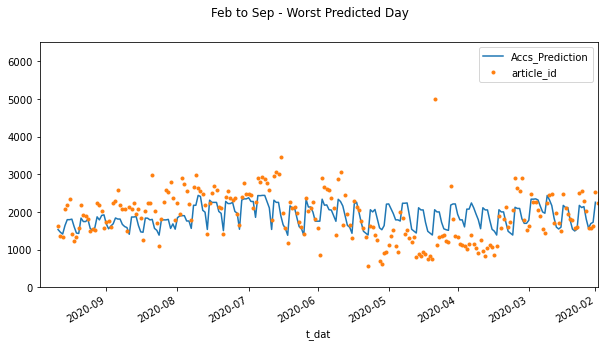

In [87]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 6500)
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
plot = plt.suptitle('Feb to Sep - Worst Predicted Day')

### ลองเปลี่ยน n_estimatior กับ learning_rate

In [271]:
# Create XGBoost Model for n_estimators= 120
reg = xgb.XGBRegressor(n_estimators=120, learning_rate=0.3)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.3, max_delta_step=0,
             max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=120, n_jobs=16,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

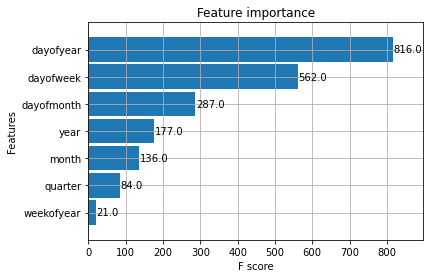

In [272]:
_ = plot_importance(reg, height=0.9)

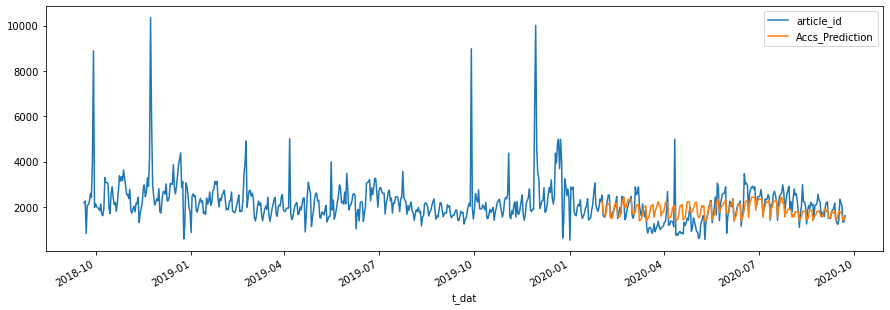

In [273]:
#Forecast on Test Set
prog_Acc_test['Accs_Prediction'] = reg.predict(X_test)
progAcc_all = pd.concat([prog_Acc_test, prog_Acc_train], sort=False)
_ = progAcc_all[['article_id','Accs_Prediction']].plot(figsize=(15, 5))

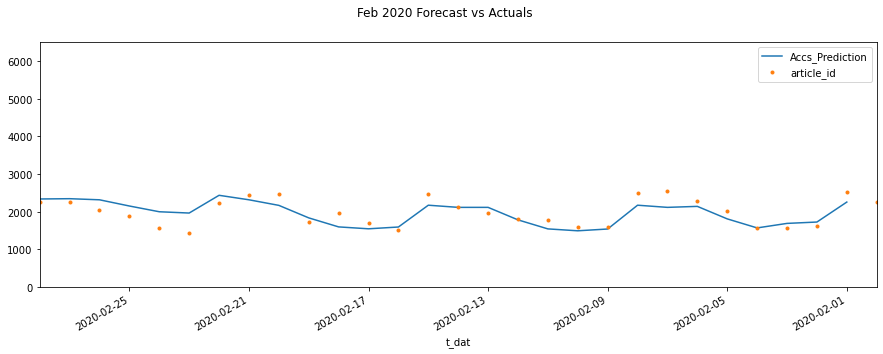

In [274]:
# 1st month
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

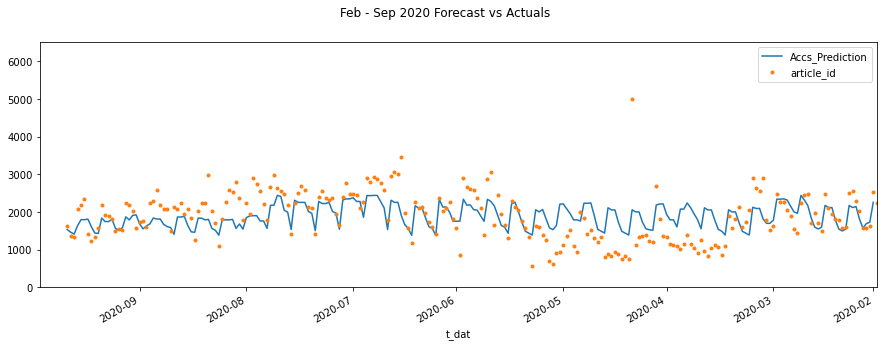

In [275]:
# 6 months
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [276]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [277]:
print(mean_squared_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))
print(mean_absolute_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))
print(mean_absolute_percentage_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))

296269.6146234011
411.4782200590093
27.121733047278774


### ลอง train/test split ใช้ Feb to Sep 2019 เป็น test

In [50]:
split_date = '2019-01-31'
prog_time = prodg_ts.copy()
prog_time = prog_time.reset_index()
prog_Acc = prog_time[prog_time['product_group_name']=='Accessories']
prog_Acc = prog_Acc.set_index('t_dat')
prog_Acc = prog_Acc.drop(['product_group_name'], axis=1)
prog_Acc_train = prog_Acc.loc[prog_Acc.index <= split_date].copy()
prog_Acc_test = prog_Acc.loc[prog_Acc.index > split_date].copy()

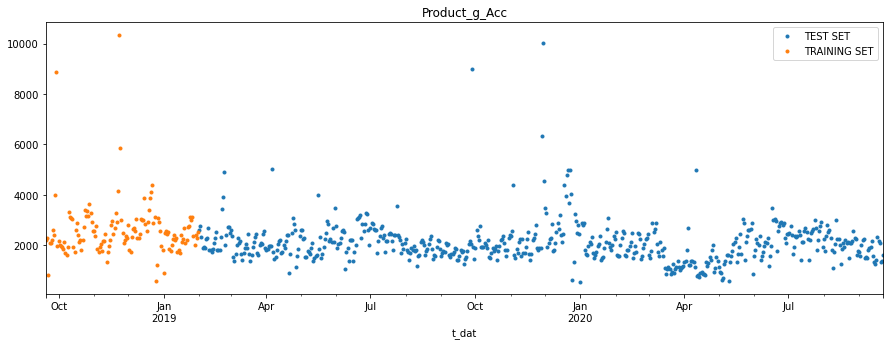

In [51]:
_ = prog_Acc_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prog_Acc_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_g_Acc', style='.')

In [52]:
create_features(df=prog_Acc_test, label=None)

<ipython-input-32-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2019-02-01,4,1,2,2019,32,1,5
2019-02-02,5,1,2,2019,33,2,5
2019-02-03,6,1,2,2019,34,3,5
2019-02-04,0,1,2,2019,35,4,6
2019-02-05,1,1,2,2019,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


In [53]:
X_train, y_train = create_features(prog_Acc_train, label='article_id')
X_test, y_test = create_features(prog_Acc_test, label='article_id')

<ipython-input-32-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



In [54]:
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=30, n_jobs=16,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

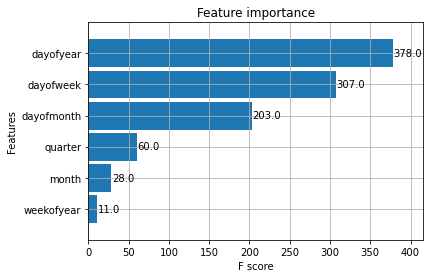

In [55]:
_ = plot_importance(reg, height=0.9)

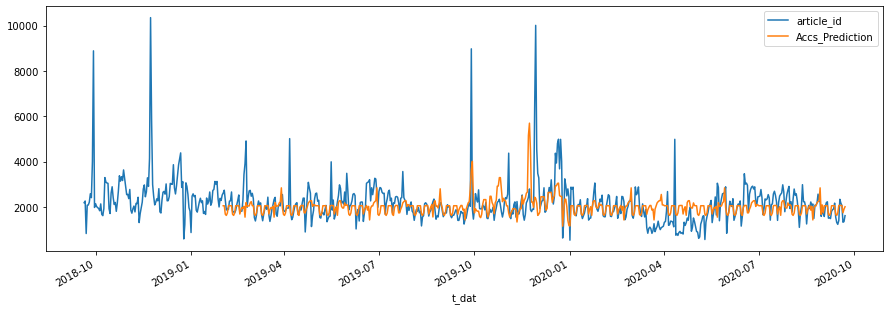

In [56]:
# Forcast on test set

prog_Acc_test['Accs_Prediction'] = reg.predict(X_test)
progAcc_all = pd.concat([prog_Acc_test, prog_Acc_train], sort=False)
_ = progAcc_all[['article_id','Accs_Prediction']].plot(figsize=(15, 5))

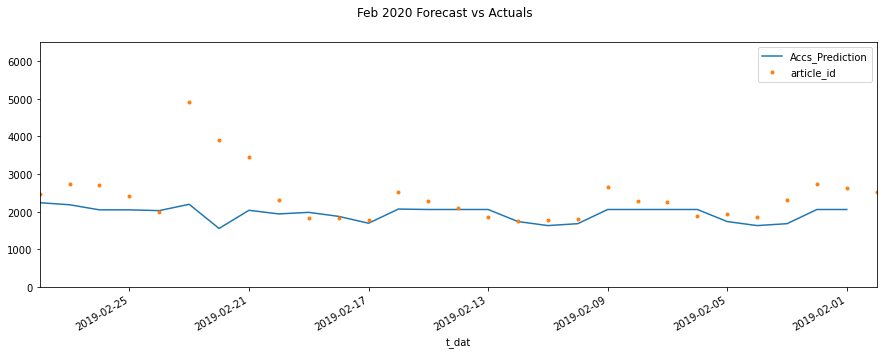

In [57]:
# look at Feb 2019
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2019', upper='28-02-2019')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

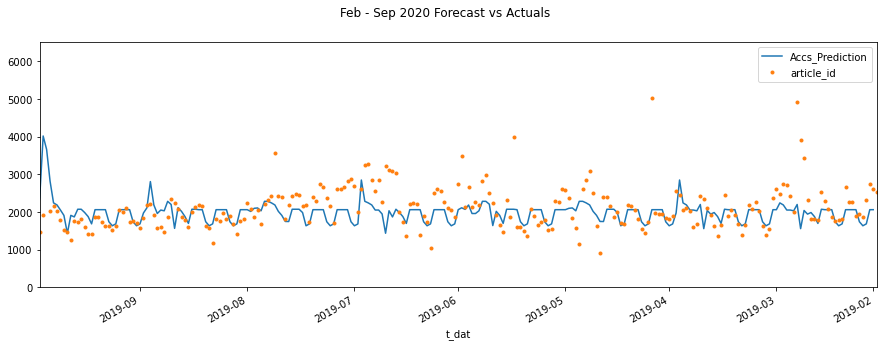

In [58]:
# look at Feb to Sep 2019
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2019', upper='30-09-2019')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

### Error Metrics On Test Set

In [59]:
mean_squared_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

578568.3988798556

In [60]:
mean_absolute_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

467.65381815592445

In [61]:
mean_absolute_percentage_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

23.91739973392159

### Look at Worst and Best Predicted Days

In [62]:
prog_Acc_test['error'] = prog_Acc_test['article_id'] - prog_Acc_test['Accs_Prediction']
prog_Acc_test['abs_error'] = prog_Acc_test['error'].apply(np.abs)
error_by_day = prog_Acc_test.groupby(['year','month','dayofmonth']) \
    .mean()[['article_id','Accs_Prediction','error','abs_error']]
# Over forecasted days

#best predict
error_by_day.sort_values('error', ascending=True)

article_id  Accs_Prediction        error    abs_error
year month dayofmonth                                                       
2019 11    23              2800.0      5700.733398 -2900.733398  2900.733398
           22              2438.0      5156.969727 -2718.969727  2718.969727
           24              1888.0      4477.887207 -2589.887207  2589.887207
     9     29              1918.0      4017.720215 -2099.720215  2099.720215
2020 3     29              1094.0      2557.962891 -1463.962891  1463.962891
...                           ...              ...          ...          ...
     4     11              4989.0      2060.778076  2928.221924  2928.221924
2019 4     6               5019.0      2060.778076  2958.221924  2958.221924
     11    28              6331.0      2437.528809  3893.471191  3893.471191
     9     28              8977.0      3659.854736  5317.145264  5317.145264
     11    29             10011.0      2382.878906  7628.121094  7628.121094

[600 rows x 4 columns]

In [63]:
# Worst absolute predicted days
error_by_day.sort_values('abs_error', ascending=False).head(10)

article_id  Accs_Prediction        error    abs_error
year month dayofmonth                                                       
2019 11    29             10011.0      2382.878906  7628.121094  7628.121094
     9     28              8977.0      3659.854736  5317.145264  5317.145264
     11    28              6331.0      2437.528809  3893.471191  3893.471191
     4     6               5019.0      2060.778076  2958.221924  2958.221924
2020 4     11              4989.0      2060.778076  2928.221924  2928.221924
2019 11    23              2800.0      5700.733398 -2900.733398  2900.733398
           22              2438.0      5156.969727 -2718.969727  2718.969727
     2     23              4916.0      2198.740967  2717.259033  2717.259033
     11    3               4378.0      1739.783081  2638.216919  2638.216919
           24              1888.0      4477.887207 -2589.887207  2589.887207

In [64]:
# Best predicted days
error_by_day.sort_values('abs_error', ascending=True).head(10)

article_id  Accs_Prediction      error  abs_error
year month dayofmonth                                                   
2020 6     9               1742.0      1740.384399   1.615601   1.615601
2019 12    13              2651.0      2647.876709   3.123291   3.123291
2020 9     1               1737.0      1740.384399  -3.384399   3.384399
           19              2069.0      2072.433594  -3.433594   3.433594
     2     18              1980.0      1984.977173  -4.977173   4.977173
     8     26              2180.0      2186.466797  -6.466797   6.466797
2019 2     12              1748.0      1740.384399   7.615601   7.615601
2020 6     29              2098.0      2107.120605  -9.120605   9.120605
2019 4     14              1675.0      1684.290283  -9.290283   9.290283
     7     7               1695.0      1684.290283  10.709717  10.709717

### Plotting some best/worst predicted days

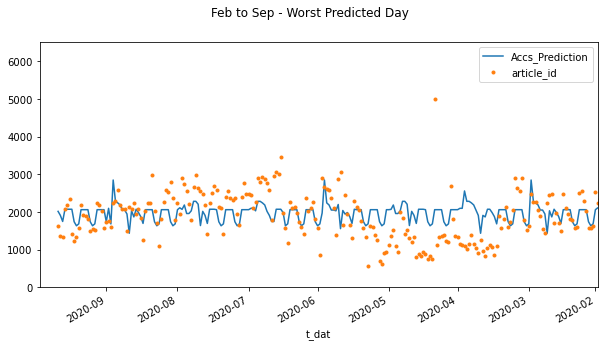

In [65]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 6500)
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
plot = plt.suptitle('Feb to Sep - Worst Predicted Day')

# Bags

### Bags train/test split ใช้ Feb to Sep 2020 เป็น test

In [74]:
split_date = '2020-01-31'
prog_time = prodg_ts.copy()
prog_time = prog_time.reset_index()
prog_Acc = prog_time[prog_time['product_group_name']=='Bags']
prog_Acc = prog_Acc.set_index('t_dat')
prog_Acc = prog_Acc.drop(['product_group_name'], axis=1)
prog_Acc_train = prog_Acc.loc[prog_Acc.index <= split_date].copy()
prog_Acc_test = prog_Acc.loc[prog_Acc.index > split_date].copy()
prog_Acc_test.head()

,article_id
t_dat,
2020-02-01,11
2020-02-02,17
2020-02-03,15
2020-02-04,22
2020-02-05,17


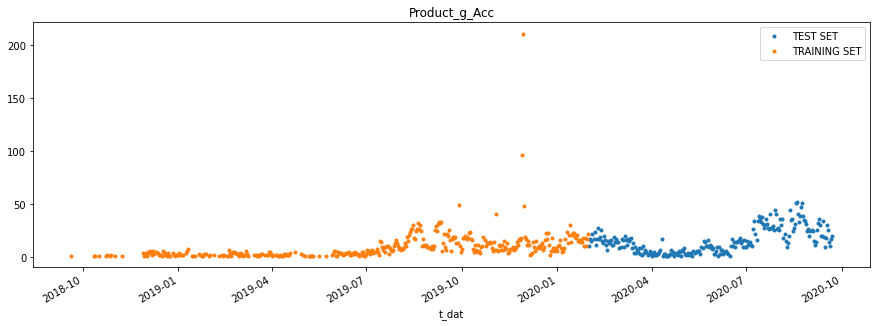

In [75]:
_ = prog_Acc_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prog_Acc_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_g_Acc', style='.')

### Create Time Series Features

In [76]:
create_features(df=prog_Acc_test, label=None)

<ipython-input-32-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


In [77]:
X_train, y_train = create_features(prog_Acc_train, label='article_id')
X_test, y_test = create_features(prog_Acc_test, label='article_id')

<ipython-input-32-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



### Create XGBoost Model

In [79]:
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=30, n_jobs=16,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

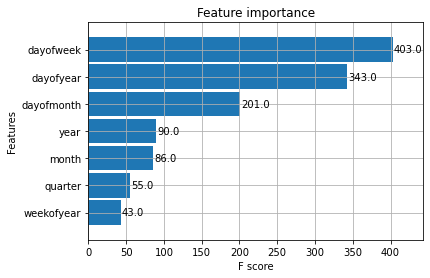

In [80]:
_ = plot_importance(reg, height=0.9)

### Forecast on Test Set

In [81]:
prog_Acc_test['Accs_Prediction'] = reg.predict(X_test)
progAcc_all = pd.concat([prog_Acc_test, prog_Acc_train], sort=False)

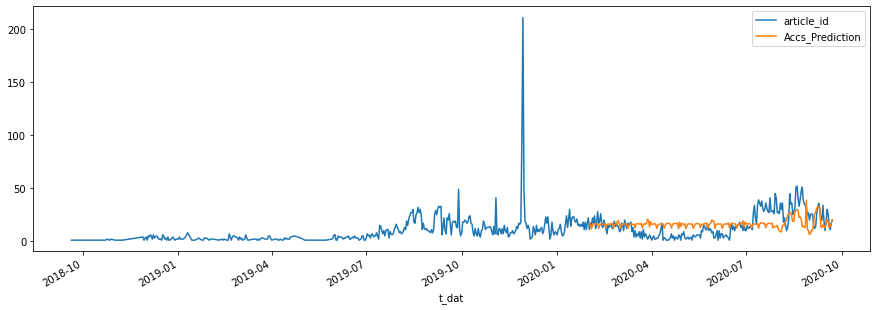

In [82]:
_ = progAcc_all[['article_id','Accs_Prediction']].plot(figsize=(15, 5))

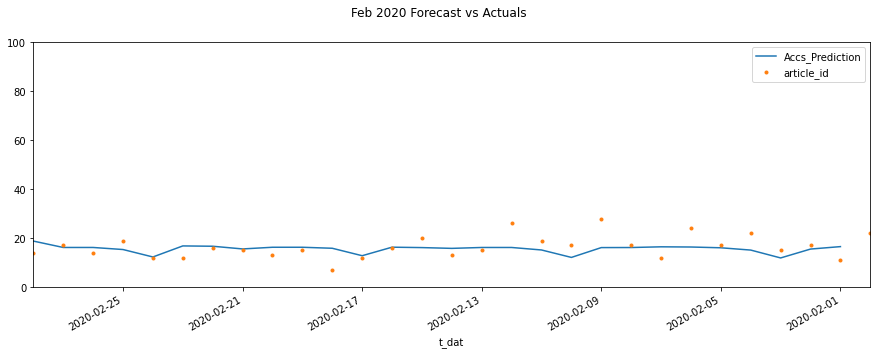

In [85]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 100)
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

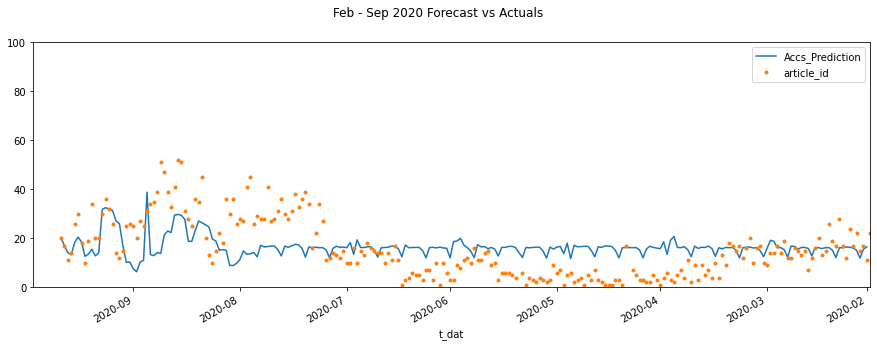

In [87]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 100)
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

### Error Metrics On Test Set

In [90]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [91]:
print(mean_squared_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))
print(mean_absolute_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))
print(mean_absolute_percentage_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))

131.672093311694
9.346564464814673
178.08334308103804


### Look at Worst and Best Predicted Days

In [93]:
prog_Acc_test['error'] = prog_Acc_test['article_id'] - prog_Acc_test['Accs_Prediction']
prog_Acc_test['abs_error'] = prog_Acc_test['error'].apply(np.abs)
error_by_day = prog_Acc_test.groupby(['year','month','dayofmonth']) \
    .mean()[['article_id','Accs_Prediction','error','abs_error']]

In [94]:
# Worst absolute predicted days
error_by_day.sort_values('abs_error', ascending=False).head(10)

article_id  Accs_Prediction      error  abs_error
year month dayofmonth                                                   
2020 8     24                51.0        13.808781  37.191219  37.191219
     7     29                45.0        13.689647  31.310353  31.310353
           30                41.0        13.474086  27.525914  27.525914
     8     3                 36.0         8.891671  27.108329  27.108329
     7     13                39.0        12.330522  26.669478  26.669478
     8     23                47.0        21.352831  25.647169  25.647169
           25                39.0        14.251382  24.748618  24.748618
     7     24                41.0        16.626968  24.373032  24.373032
           20                36.0        12.812213  23.187787  23.187787
     8     19                52.0        29.790798  22.209202  22.209202

In [95]:
# Best predicted days
error_by_day.sort_values('abs_error', ascending=True).head(10)

article_id  Accs_Prediction     error  abs_error
year month dayofmonth                                                  
2020 7     6                 12.0        12.036572 -0.036572   0.036572
     9     8                 32.0        31.944414  0.055586   0.055586
           21                17.0        17.067337 -0.067337   0.067337
     6     23                15.0        15.123029 -0.123029   0.123029
           17                17.0        16.834688  0.165312   0.165312
     3     10                15.0        15.170894 -0.170894   0.170894
           4                 16.0        16.218784 -0.218784   0.218784
     7     11                16.0        16.263624 -0.263624   0.263624
     2     16                16.0        16.308313 -0.308313   0.308313
           24                12.0        12.308668 -0.308668   0.308668

### Plotting some best/worst predicted days

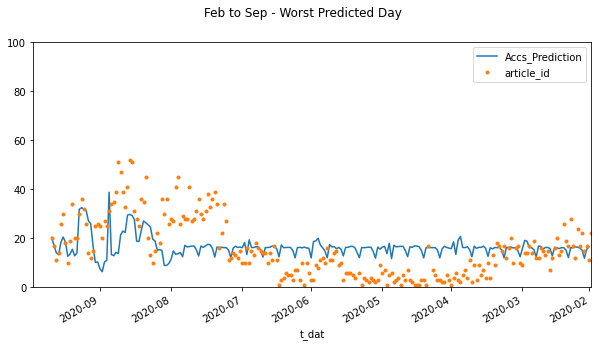

In [97]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 100)
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
plot = plt.suptitle('Feb to Sep - Worst Predicted Day')

In [363]:
import zipfile
from PIL import Image

imgzip = zipfile.ZipFile("images_3.zip")

# Trousers

In [61]:
!pip install xgboost
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error
import plotly.express as px

You should consider upgrading via the 'c:\users\kornc\documents\anaconda3\python.exe -m pip install --upgrade pip' command.


            article_id
t_dat                 
2020-02-01        5776
2020-02-02        4810
2020-02-03        4770
2020-02-04        4426
2020-02-05        5753


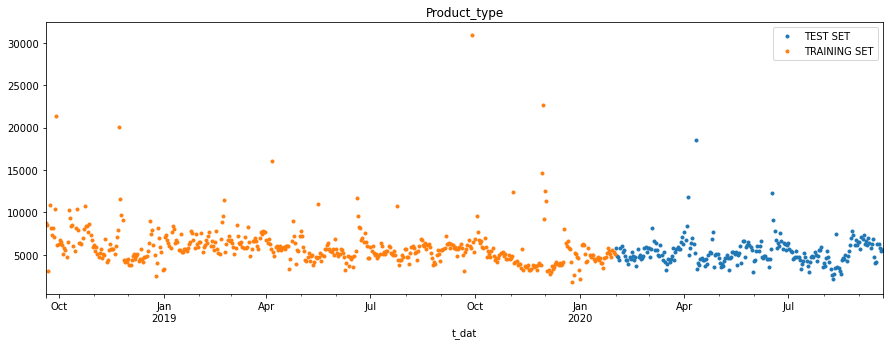

In [281]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='Trousers']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [282]:
#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-282-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-282-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


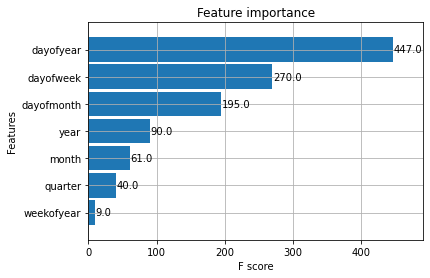

In [283]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

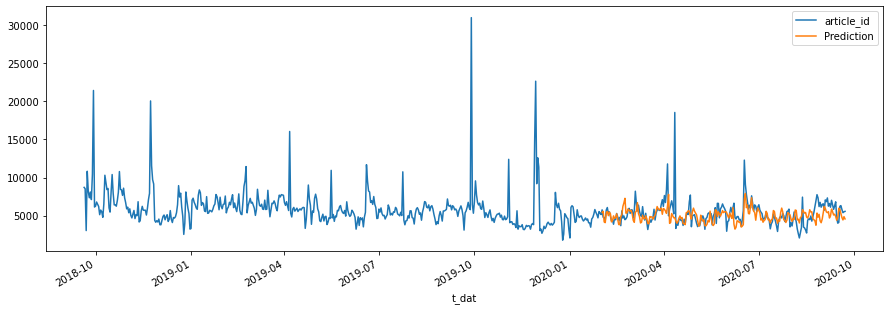

In [284]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

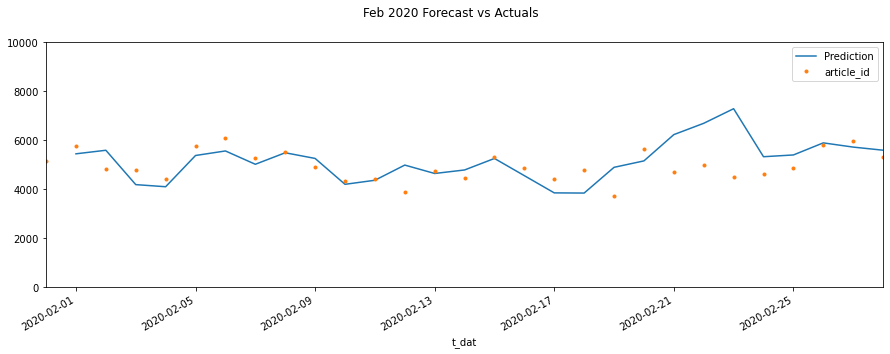

In [285]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

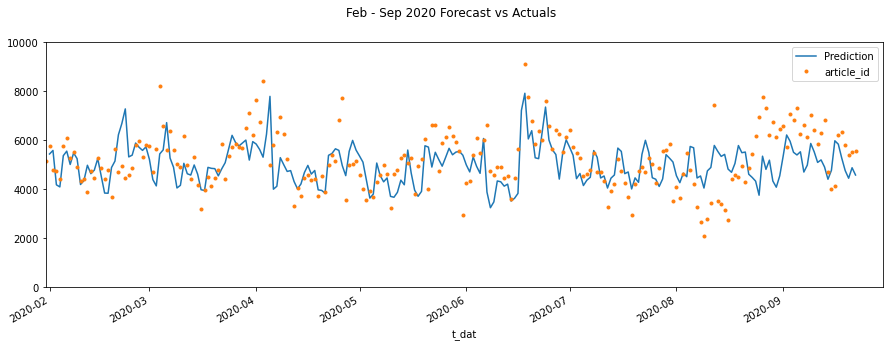

In [286]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [78]:
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))



2244082.3567399653
953.4191250415558
17.692917549390312


In [71]:
#Look at Worst and Best Predicted Days
prodt_test['error'] = prodt_test['article_id'] - prodt_test['Prediction']
prodt_test['abs_error'] = prodt_test['error'].apply(np.abs)
prodt_test['percent_error'] = (prodt_test['abs_error']/prodt_test['article_id'])*100
error_by_day = prodt_test.groupby(['year','month','dayofmonth']) \
    .mean()[['article_id','Prediction','error','abs_error','percent_error']]
# Worst absolute predicted days
error_by_day.sort_values('percent_error', ascending=False).head(20)

article_id   Prediction         error     abs_error  \
year month dayofmonth                                                        
2020 8     9               2093.0  4054.925049  -1961.925049   1961.925049   
     5     31              2971.0  5395.707520  -2424.707520   2424.707520   
     8     16              2743.0  4828.976562  -2085.976562   2085.976562   
     4     11             18538.0  4767.055664  13770.944336  13770.944336   
     8     15              3143.0  5429.402344  -2286.402344   2286.402344   
           8               2647.0  4547.364258  -1900.364258   1900.364258   
           10              2786.0  4756.626465  -1970.626465   1970.626465   
     2     23              4485.0  7287.276855  -2802.276855   2802.276855   
     8     13              3530.0  5555.736816  -2025.736816   2025.736816   
           14              3409.0  5347.398438  -1938.398438   1938.398438   
     4     5               4996.0  7799.074707  -2803.074707   2803.074707   
           4              11792.0  6258.650391   5533.349609   5533.349609   
     8     25              6974.0  3761.061279   3212.938721   3212.938721   
     9     16              4135.0  5984.908203  -1849.908203   1849.908203   
     7     31              3542.0  5116.942871  -1574.942871   1574.942871   
     5     21              3999.0  5727.382812  -1728.382812   1728.382812   
     8     11              3454.0  4894.985840  -1440.985840   1440.985840   
     6     7               6650.0  3891.112061   2758.887939   2758.887939   
           17             12293.0  7224.700684   5068.299316   5068.299316   
     4     3               8422.0  5315.038086   3106.961914   3106.961914   

                       percent_error  
year month dayofmonth                 
2020 8     9               93.737461  
     5     31              81.612505  
     8     16              76.047268  
     4     11              74.284952  
     8     15              72.745859  
           8               71.793134  
           10              70.733183  
     2     23              62.481089  
     8     13              57.386312  
           14              56.861204  
     4     5               56.106379  
           4               46.924607  
     8     25              46.070243  
     9     16              44.737804  
     7     31              44.464790  
     5     21              43.220375  
     8     11              41.719335  
     6     7               41.487037  
           17              41.229149  
     4     3               36.891022

In [193]:
# Best predicted days
error_by_day.sort_values('percent_error', ascending=True).head(20)

article_id   Prediction       error   abs_error  \
year month dayofmonth                                                    
2020 5     7               4587.0  4563.744141   23.255859   23.255859   
     2     8               5517.0  5488.034668   28.965332   28.965332   
     3     17              3978.0  3954.539795   23.460205   23.460205   
     6     26              5651.0  5616.221191   34.778809   34.778809   
     5     30              5588.0  5552.128906   35.871094   35.871094   
     3     26              5872.0  5916.884277  -44.884277   44.884277   
     2     15              5298.0  5255.457031   42.542969   42.542969   
     4     13              4055.0  4021.572021   33.427979   33.427979   
     6     29              5542.0  5492.075195   49.924805   49.924805   
     3     27              5716.0  5773.361816  -57.361816   57.361816   
     2     29              5795.0  5735.290039   59.709961   59.709961   
     8     3               4614.0  4663.457520  -49.457520   49.457520   
     6     6               5999.0  6078.338379  -79.338379   79.338379   
     2     26              5815.0  5891.905273  -76.905273   76.905273   
     4     23              5386.0  5466.065430  -80.065430   80.065430   
           21              3907.0  3845.729736   61.270264   61.270264   
     2     11              4435.0  4364.680664   70.319336   70.319336   
     6     3               5423.0  5324.747559   98.252441   98.252441   
     7     8               5483.0  5585.023438 -102.023438  102.023438   
     6     30              6147.0  6024.611328  122.388672  122.388672   

                       percent_error  
year month dayofmonth                 
2020 5     7                0.506995  
     2     8                0.525020  
     3     17               0.589749  
     6     26               0.615445  
     5     30               0.641931  
     3     26               0.764378  
     2     15               0.803001  
     4     13               0.824364  
     6     29               0.900845  
     3     27               1.003531  
     2     29               1.030370  
     8     3                1.071901  
     6     6                1.322527  
     2     26               1.322533  
     4     23               1.486547  
           21               1.568218  
     2     11               1.585554  
     6     3                1.811773  
     7     8                1.860723  
     6     30               1.991031

## ดู detail Trousers

In [360]:
#ดู detail
df = tsat[tsat['product_type_name']=='Trousers']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()
inflist



<ipython-input-360-c4546902f90b>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


['0706016001.jpg',
 '0706016002.jpg',
 '0399223001.jpg',
 '0706016003.jpg',
 '0562245046.jpg',
 '0562245001.jpg',
 '0399256001.jpg',
 '0448509014.jpg',
 '0751471001.jpg',
 '0573716012.jpg',
 '0706016015.jpg',
 '0554450001.jpg',
 '0562245018.jpg',
 '0636323001.jpg',
 '0783346001.jpg',
 '0706016006.jpg',
 '0399256005.jpg',
 '0448509001.jpg',
 '0803757001.jpg',
 '0568597006.jpg',
 '0562245050.jpg',
 '0539723005.jpg',
 '0573085028.jpg',
 '0399223029.jpg',
 '0753737001.jpg']

In [204]:
len(set(df['article_id']))

11060

In [344]:
### แบบโชว์ทีละรูปเด้งขึ้นมา
# from io import BytesIO
# from zipfile import ZipFile
# from PIL import Image

# with ZipFile("images_3.zip", "r") as zipFile:
#     imgs = inflist
#     print(imgs[0])
#     img = zipFile.read(imgs[0])
#     processedImg = Image.open(BytesIO(img))
#     processedImg.show()

0706016001.jpg


In [362]:
#แบบโชว์ทีละรูปแบบต่อกัน
# import zipfile
# from PIL import Image

# imgzip = zipfile.ZipFile("images_3.zip")

# for f in inflist:
#     ifile = imgzip.open(f)
#     img = Image.open(ifile)
#     print(img)
#     display(img)
    


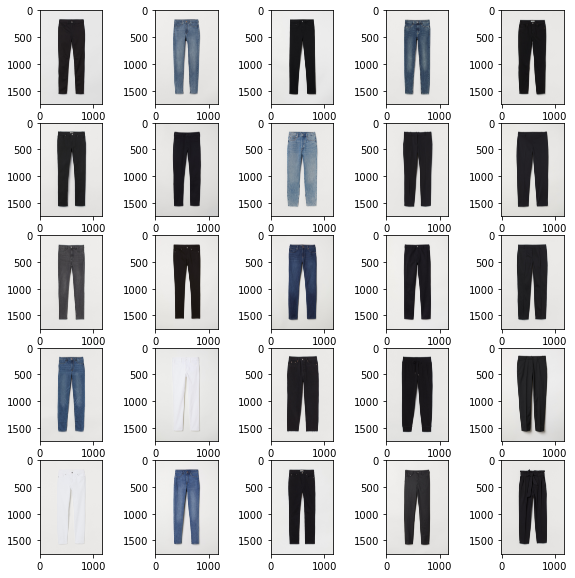

In [361]:
import zipfile
from PIL import Image

imgzip = zipfile.ZipFile("images_3.zip")

plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

# Dress

            article_id
t_dat                 
2020-02-01        2590
2020-02-02        2400
2020-02-03        2750
2020-02-04        2543
2020-02-05        2826


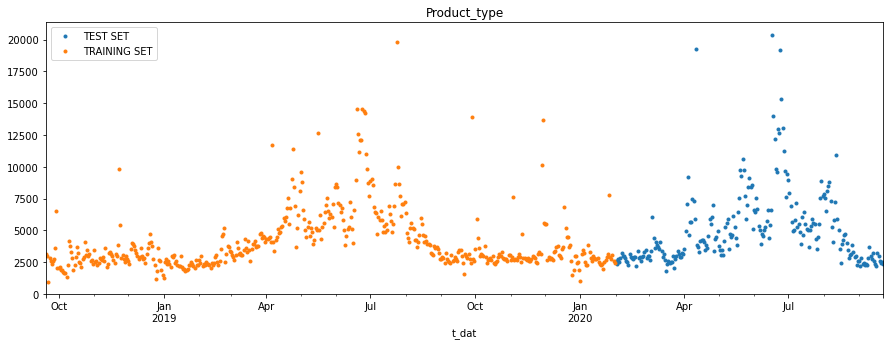

In [79]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='Dress']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [80]:
#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-80-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-80-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


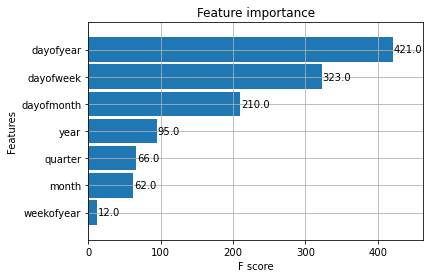

In [81]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

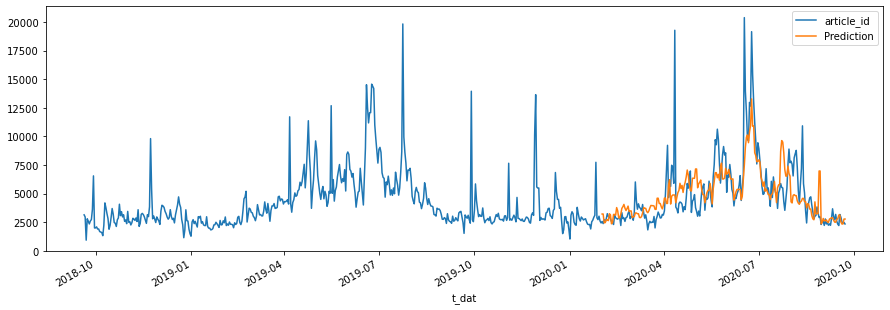

In [82]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

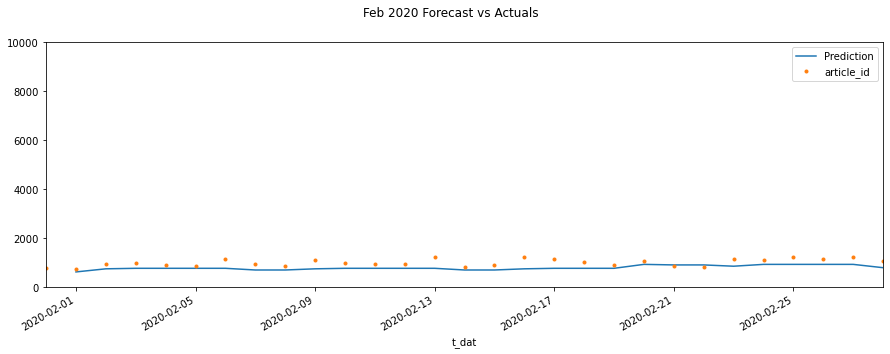

In [279]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

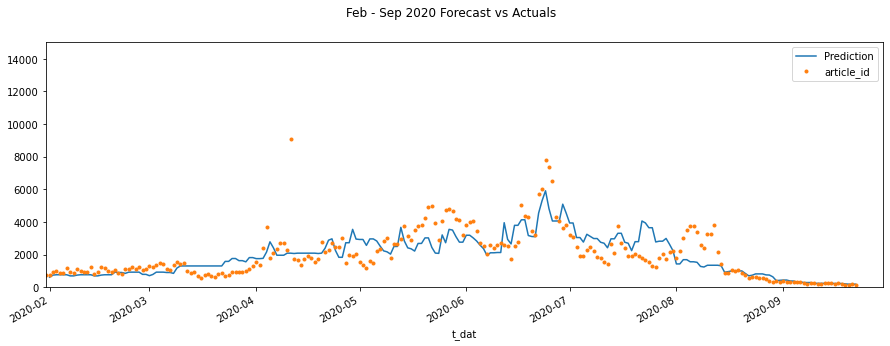

In [280]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 15000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [85]:
# Error Metrics On Test Set
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))


4388999.106430136
1315.2338056848405
25.577542974546635


In [86]:
#Look at Worst and Best Predicted Days
prodt_test['error'] = prodt_test['article_id'] - prodt_test['Prediction']
prodt_test['abs_error'] = prodt_test['error'].apply(np.abs)
prodt_test['percent_error'] = (prodt_test['abs_error']/prodt_test['article_id'])*100
error_by_day = prodt_test.groupby(['year','month','dayofmonth']) \
    .mean()[['article_id','Prediction','error','abs_error','percent_error']]
# Worst absolute predicted days
error_by_day.sort_values('percent_error', ascending=False).head(20)

article_id   Prediction         error     abs_error  \
year month dayofmonth                                                        
2020 8     28              2931.0  6989.365234  -4058.365234   4058.365234   
           29              2989.0  6989.365234  -4000.365234   4000.365234   
     5     2               3462.0  7165.369141  -3703.369141   3703.369141   
     7     26              3556.0  7100.742676  -3544.742676   3544.742676   
           25              4320.0  8588.116211  -4268.116211   4268.116211   
     5     5               3062.0  6013.881836  -2951.881836   2951.881836   
           1               3797.0  7165.369141  -3368.369141   3368.369141   
           3               3042.0  5525.198242  -2483.198242   2483.198242   
     3     16              1850.0  3349.528809  -1499.528809   1499.528809   
           23              2022.0  3641.742432  -1619.742432   1619.742432   
     4     11             19271.0  4895.746094  14375.253906  14375.253906   
     7     23              5557.0  9642.582031  -4085.582031   4085.582031   
           24              5511.0  9513.994141  -4002.994141   4002.994141   
     5     4               3494.0  5867.386230  -2373.386230   2373.386230   
     4     21              3623.0  5994.943359  -2371.943359   2371.943359   
     6     17             20374.0  7498.339844  12875.660156  12875.660156   
     3     19              2475.0  3983.614746  -1508.614746   1508.614746   
           21              2507.0  3965.582764  -1458.582764   1458.582764   
     8     12             10931.0  4598.154785   6332.845215   6332.845215   
     3     20              2529.0  3965.582764  -1436.582764   1436.582764   

                       percent_error  
year month dayofmonth                 
2020 8     28             138.463502  
           29             133.836241  
     5     2              106.971957  
     7     26              99.683427  
           25              98.798986  
     5     5               96.403718  
           1               88.711328  
           3               81.630448  
     3     16              81.055611  
           23              80.105956  
     4     11              74.595267  
     7     23              73.521361  
           24              72.636439  
     5     4               67.927482  
     4     21              65.469041  
     6     17              63.196526  
     3     19              60.954131  
           21              58.180405  
     8     12              57.934729  
     3     20              56.804380

<ipython-input-364-c974b67b8c72>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


KeyError: "There is no item named '0212629004.jpg' in the archive"

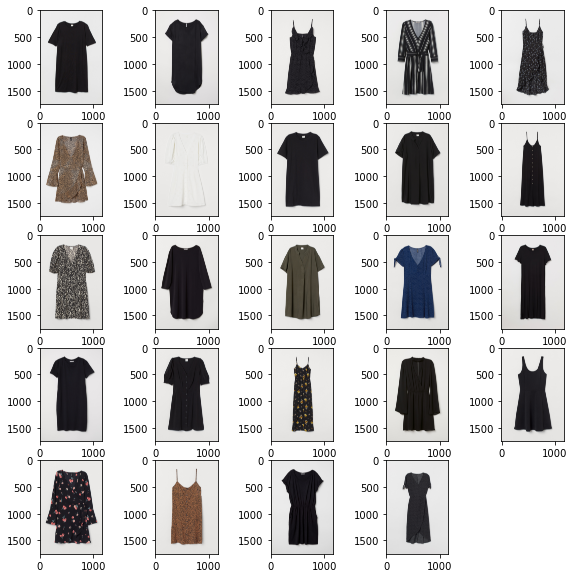

In [364]:
#ดู detail
df = tsat[tsat['product_type_name']=='Dress']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()


plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

# Sweater

            article_id
t_dat                 
2020-02-01        4305
2020-02-02        3175
2020-02-03        3149
2020-02-04        3119
2020-02-05        3547


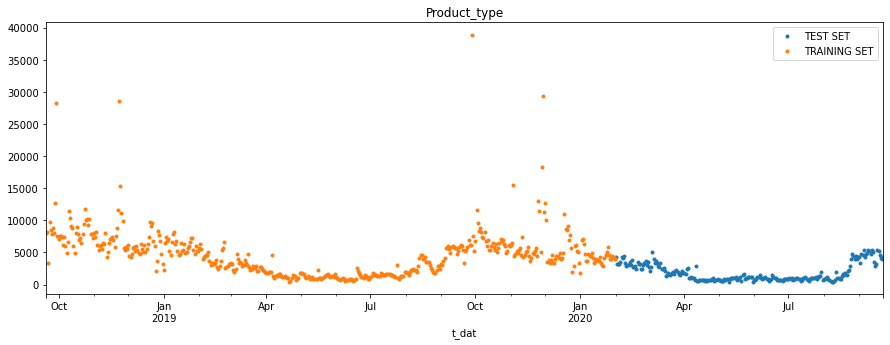

In [88]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='Sweater']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [89]:
#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-89-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-89-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


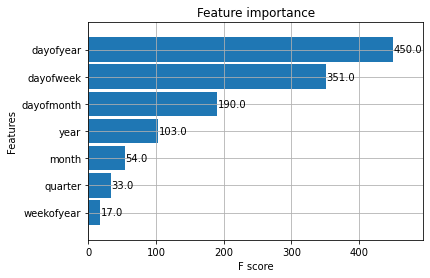

In [90]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

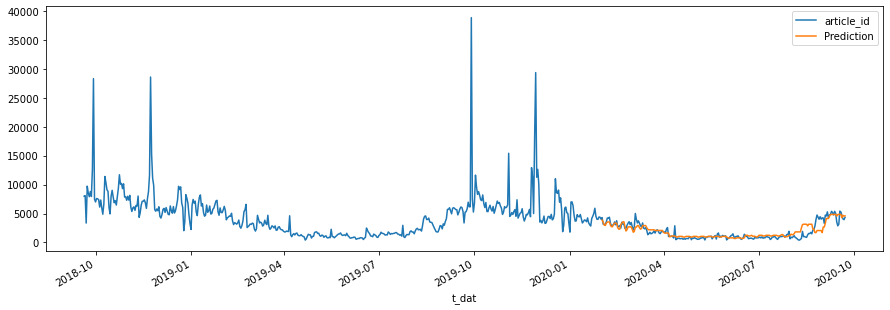

In [91]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

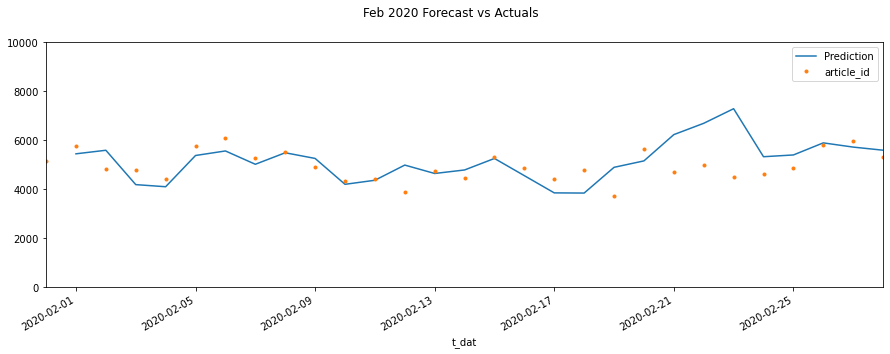

In [287]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

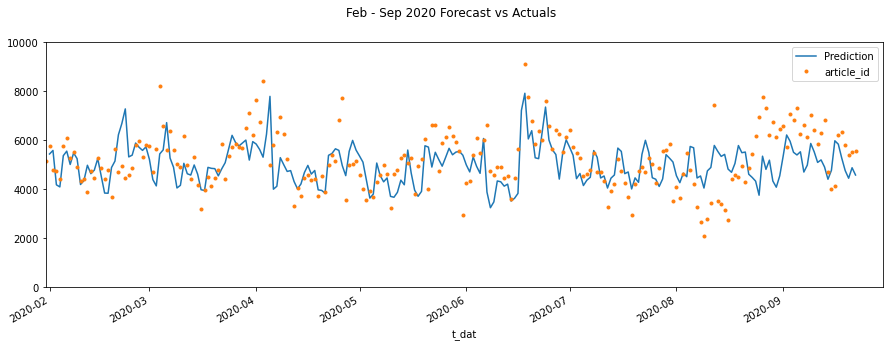

In [288]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [94]:
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

595907.79929413
537.0614288979389
40.70288114428533


In [95]:
#Look at Worst and Best Predicted Days
prodt_test['error'] = prodt_test['article_id'] - prodt_test['Prediction']
prodt_test['abs_error'] = prodt_test['error'].apply(np.abs)
prodt_test['percent_error'] = (prodt_test['abs_error']/prodt_test['article_id'])*100
error_by_day = prodt_test.groupby(['year','month','dayofmonth']) \
    .mean()[['article_id','Prediction','error','abs_error','percent_error']]
# Worst absolute predicted days
error_by_day.sort_values('percent_error', ascending=False).head(20)

article_id   Prediction        error    abs_error  \
year month dayofmonth                                                      
2020 8     9                401.0  1831.146851 -1430.146851  1430.146851   
           8                453.0  1831.146851 -1378.146851  1378.146851   
           11               708.0  2528.837402 -1820.837402  1820.837402   
           16               890.0  3156.759766 -2266.759766  2266.759766   
           10               529.0  1831.146851 -1302.146851  1302.146851   
           15               935.0  3156.759766 -2221.759766  2221.759766   
           13              1015.0  3156.759766 -2141.759766  2141.759766   
           14              1027.0  3156.759766 -2129.759766  2129.759766   
           7                618.0  1831.146851 -1213.146851  1213.146851   
           6                779.0  1831.146851 -1052.146851  1052.146851   
     7     12               516.0  1145.354858  -629.354858   629.354858   
     5     10               440.0   958.566162  -518.566162   518.566162   
     8     17              1319.0  2869.008789 -1550.008789  1550.008789   
     7     19               528.0  1145.354858  -617.354858   617.354858   
     5     31               443.0   958.566162  -515.566162   515.566162   
     8     21              1499.0  3156.759766 -1657.759766  1657.759766   
     4     12               487.0  1020.187500  -533.187500   533.187500   
     8     5                876.0  1831.146851  -955.146851   955.146851   
           19              1529.0  3156.759766 -1627.759766  1627.759766   
           18              1564.0  3156.759766 -1592.759766  1592.759766   

                       percent_error  
year month dayofmonth                 
2020 8     9              356.645100  
           8              304.226678  
           11             257.180424  
           16             254.692108  
           10             246.152524  
           15             237.621365  
           13             211.010814  
           14             207.376803  
           7              196.302079  
           6              135.063781  
     7     12             121.967996  
     5     10             117.855946  
     8     17             117.513934  
     7     19             116.923269  
     5     31             116.380624  
     8     21             110.591045  
     4     12             109.484086  
     8     5              109.035029  
           19             106.459108  
           18             101.838860

<ipython-input-365-53ff8c2717cd>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


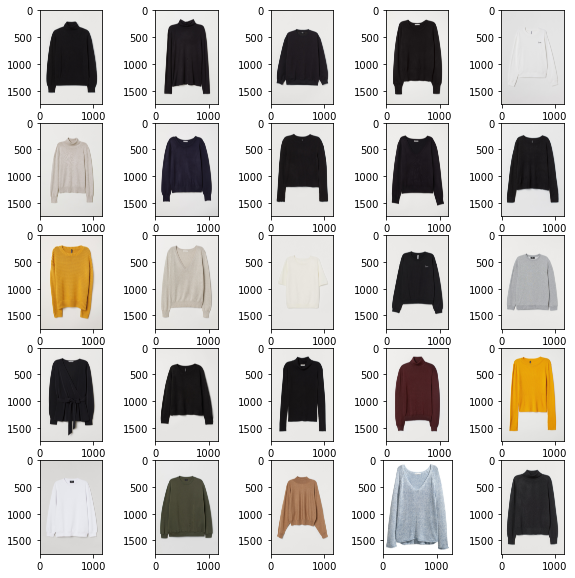

In [365]:
#ดู detail
df = tsat[tsat['product_type_name']=='Sweater']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()


plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

# Blouse

            article_id
t_dat                 
2020-02-01        1668
2020-02-02        1184
2020-02-03        1188
2020-02-04        1122
2020-02-05        1492


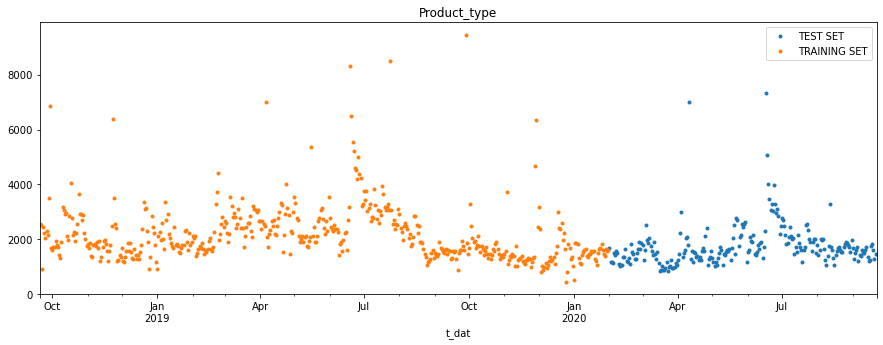

In [289]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='Blouse']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [290]:
#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-290-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-290-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


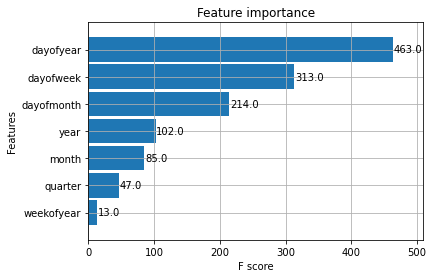

In [291]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

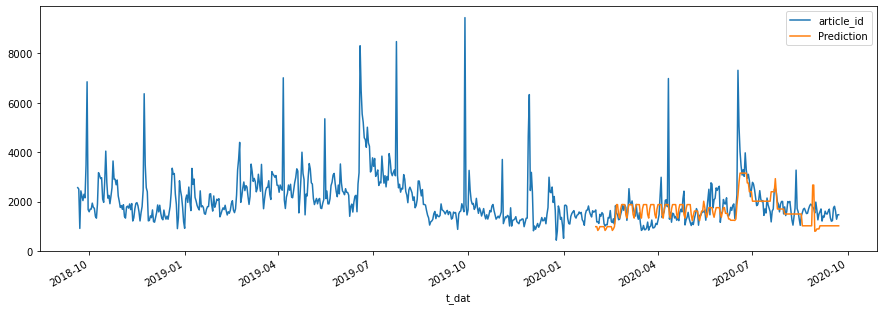

In [292]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

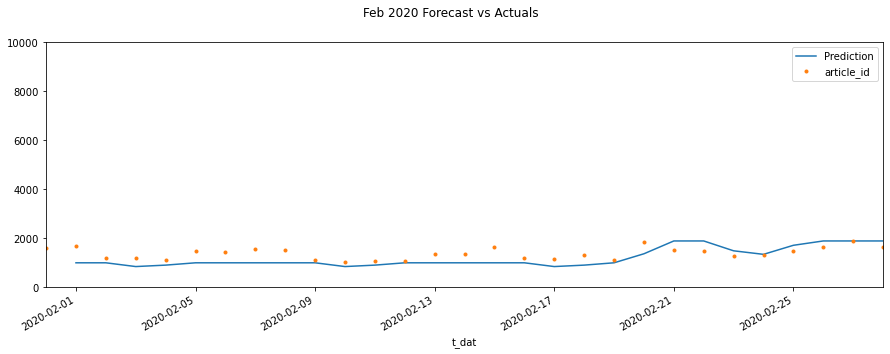

In [293]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

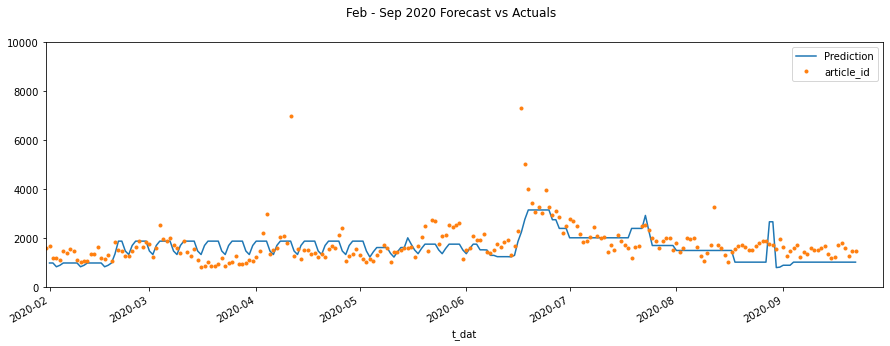

In [294]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [102]:
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

481302.0628077412
449.8817813954455
26.33576266847567


In [103]:
#Look at Worst and Best Predicted Days
prodt_test['error'] = prodt_test['article_id'] - prodt_test['Prediction']
prodt_test['abs_error'] = prodt_test['error'].apply(np.abs)
prodt_test['percent_error'] = (prodt_test['abs_error']/prodt_test['article_id'])*100
error_by_day = prodt_test.groupby(['year','month','dayofmonth']) \
    .mean()[['article_id','Prediction','error','abs_error','percent_error']]
# Worst absolute predicted days
error_by_day.sort_values('percent_error', ascending=False).head(20)

article_id   Prediction        error    abs_error  \
year month dayofmonth                                                      
2020 3     19               870.0  1885.363892 -1015.363892  1015.363892   
           20               873.0  1885.363892 -1012.363892  1012.363892   
     7     19              1185.0  2405.440430 -1220.440430  1220.440430   
     3     21               942.0  1885.363892  -943.363892   943.363892   
           27               943.0  1885.363892  -942.363892   942.363892   
           28               946.0  1885.363892  -939.363892   939.363892   
           17               885.0  1708.129028  -823.129028   823.129028   
           25              1020.0  1885.363892  -865.363892   865.363892   
           18              1041.0  1885.363892  -844.363892   844.363892   
           24               984.0  1708.129028  -724.129028   724.129028   
     4     11              6986.0  1885.363892  5100.636108  5100.636108   
     6     17              7319.0  2258.707764  5060.292236  5060.292236   
     5     2               1167.0  1885.363892  -718.363892   718.363892   
     3     16               841.0  1338.538696  -497.538696   497.538696   
     8     31              1986.0   822.649536  1163.350464  1163.350464   
     3     31              1079.0  1708.129028  -629.129028   629.129028   
           23               851.0  1338.538696  -487.538696   487.538696   
     8     29              1729.0  2676.209229  -947.209229   947.209229   
           12              3280.0  1504.374023  1775.625977  1775.625977   
     4     1               1256.0  1885.363892  -629.363892   629.363892   

                       percent_error  
year month dayofmonth                 
2020 3     19             116.708493  
           20             115.963791  
     7     19             102.990754  
     3     21             100.144787  
           27              99.932544  
           28              99.298509  
           17              93.008930  
           25              84.839597  
           18              81.110845  
           24              73.590348  
     4     11              73.012255  
     6     17              69.139121  
     5     2               61.556460  
     3     16              59.160368  
     8     31              58.577566  
     3     31              58.306675  
           23              57.290094  
     8     29              54.783645  
           12              54.134938  
     4     1               50.108590

<ipython-input-366-7b721116e4ea>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


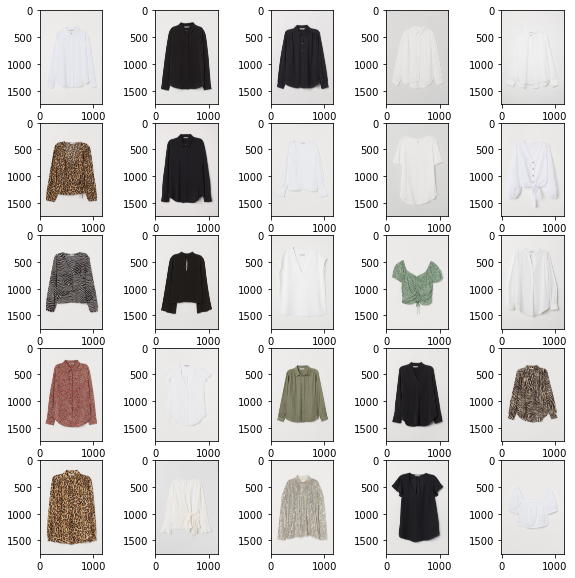

In [366]:
#ดู detail
df = tsat[tsat['product_type_name']=='Blouse']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()


plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

# Jacket

            article_id
t_dat                 
2020-02-01         790
2020-02-02         732
2020-02-03         685
2020-02-04         720
2020-02-05         771


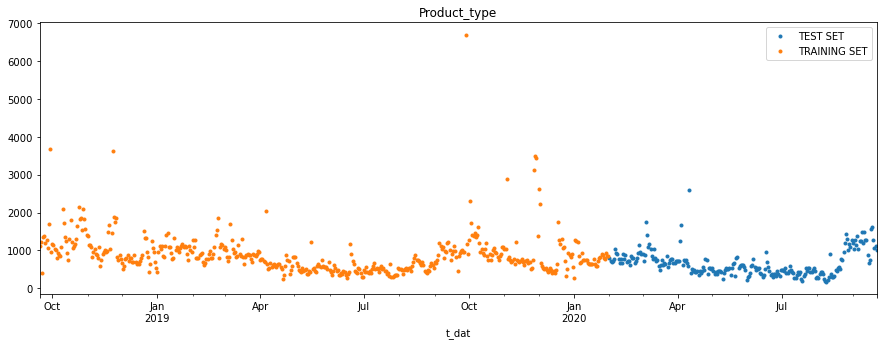

In [295]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='Jacket']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [296]:
#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-296-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-296-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


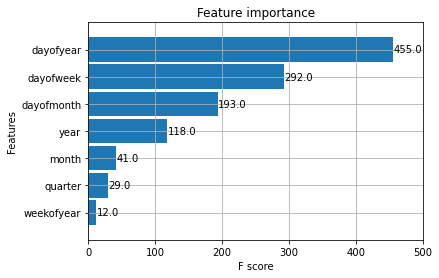

In [297]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

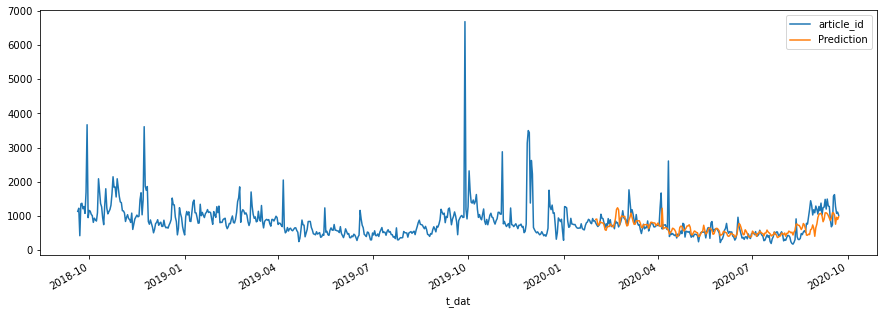

In [298]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

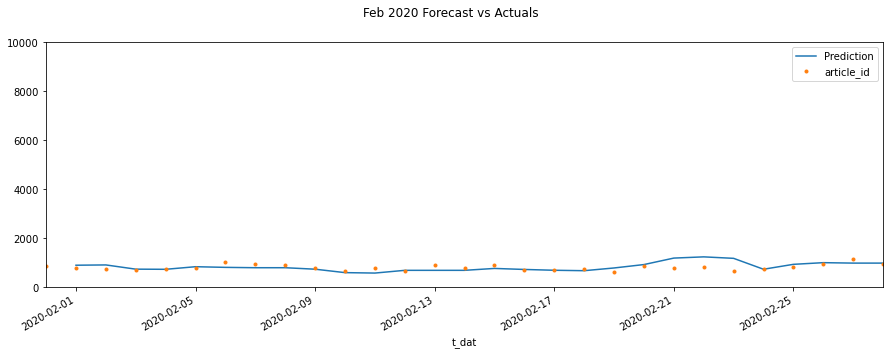

In [299]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

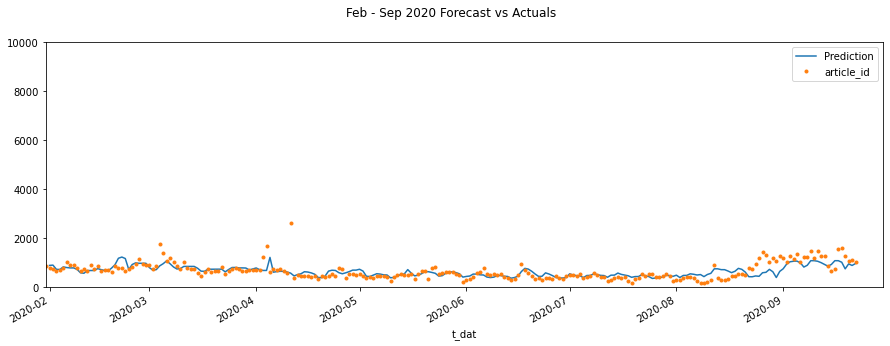

In [300]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [110]:
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

72124.91278187826
171.59018983232215
27.89815331993696


In [111]:
#Look at Worst and Best Predicted Days
prodt_test['error'] = prodt_test['article_id'] - prodt_test['Prediction']
prodt_test['abs_error'] = prodt_test['error'].apply(np.abs)
prodt_test['percent_error'] = (prodt_test['abs_error']/prodt_test['article_id'])*100
error_by_day = prodt_test.groupby(['year','month','dayofmonth']) \
    .mean()[['article_id','Prediction','error','abs_error','percent_error']]
# Worst absolute predicted days
error_by_day.sort_values('percent_error', ascending=False).head(20)

article_id   Prediction        error    abs_error  \
year month dayofmonth                                                      
2020 8     8                188.0   520.386719  -332.386719   332.386719   
           9                168.0   436.614624  -268.614624   268.614624   
           15               302.0   719.933838  -417.933838   417.933838   
           10               220.0   523.619873  -303.619873   303.619873   
           14               307.0   720.609985  -413.609985   413.609985   
     7     19               188.0   407.991882  -219.991882   219.991882   
     8     7                240.0   502.202759  -262.202759   262.202759   
     4     5                613.0  1221.263184  -608.263184   608.263184   
     8     16               336.0   663.784546  -327.784546   327.784546   
           13               386.0   754.814636  -368.814636   368.814636   
     7     18               242.0   470.866364  -228.866364   228.866364   
     5     31               216.0   416.024719  -200.024719   200.024719   
           21               338.0   637.157898  -299.157898   299.157898   
     8     11               305.0   570.403748  -265.403748   265.403748   
     4     11              2607.0   579.205017  2027.794983  2027.794983   
     2     23               674.0  1175.020874  -501.020874   501.020874   
     7     13               285.0   495.034180  -210.034180   210.034180   
           31               265.0   447.028320  -182.028320   182.028320   
     8     30              1088.0   399.067261   688.932739   688.932739   
     5     10               238.0   388.300812  -150.300812   150.300812   

                       percent_error  
year month dayofmonth                 
2020 8     8              176.801446  
           9              159.889657  
           15             138.388688  
           10             138.009033  
           14             134.726380  
     7     19             117.016959  
     8     7              109.251149  
     4     5               99.227273  
     8     16              97.554924  
           13              95.547833  
     7     18              94.572877  
     5     31              92.604037  
           21              88.508254  
     8     11              87.017622  
     4     11              77.782700  
     2     23              74.335441  
     7     13              73.696203  
           31              68.689932  
     8     30              63.321024  
     5     10              63.151602

<ipython-input-367-14dfc8b5e7e2>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


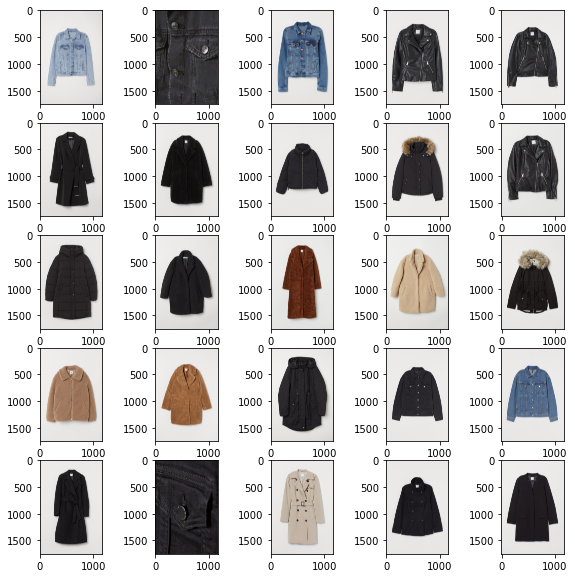

In [367]:
#ดู detail
df = tsat[tsat['product_type_name']=='Jacket']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()


plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

# Skirt

            article_id
t_dat                 
2020-02-01         986
2020-02-02         771
2020-02-03         816
2020-02-04         842
2020-02-05         926


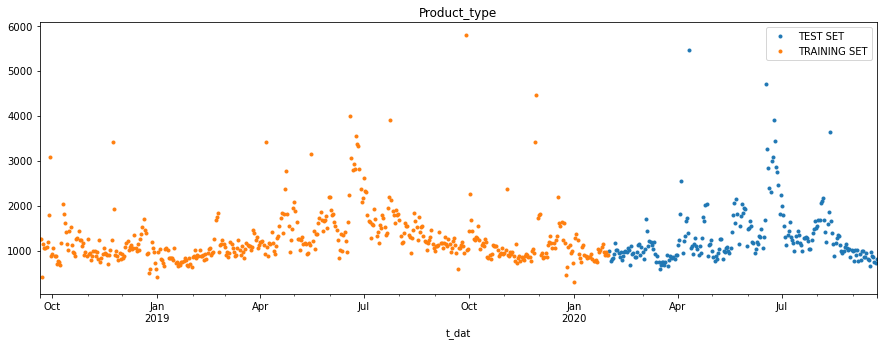

In [301]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='Skirt']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [302]:
#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-302-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-302-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


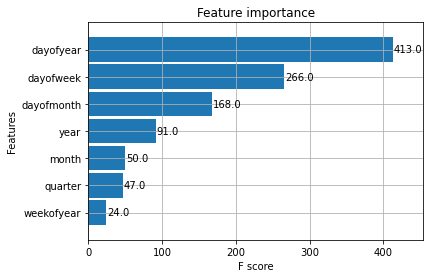

In [303]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

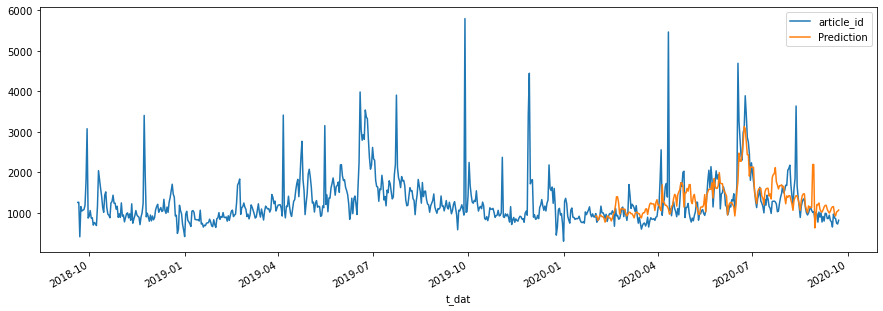

In [304]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

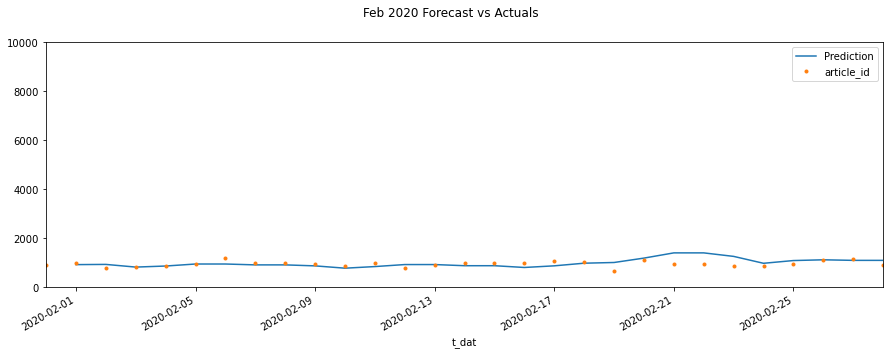

In [305]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

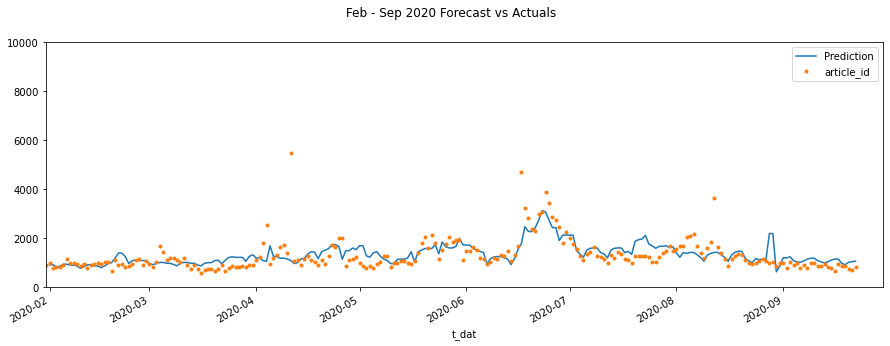

In [306]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [118]:
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

262032.00454367348
305.1218539623504
23.586244902359464


<ipython-input-368-f838e2315ebd>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


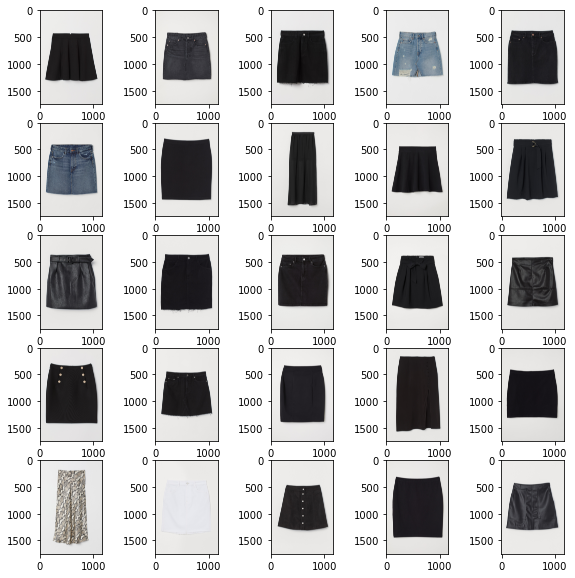

In [368]:
#ดู detail
df = tsat[tsat['product_type_name']=='Skirt']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()


plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

# Top

            article_id
t_dat                 
2020-02-01        1990
2020-02-02        1661
2020-02-03        1669
2020-02-04        1831
2020-02-05        2053


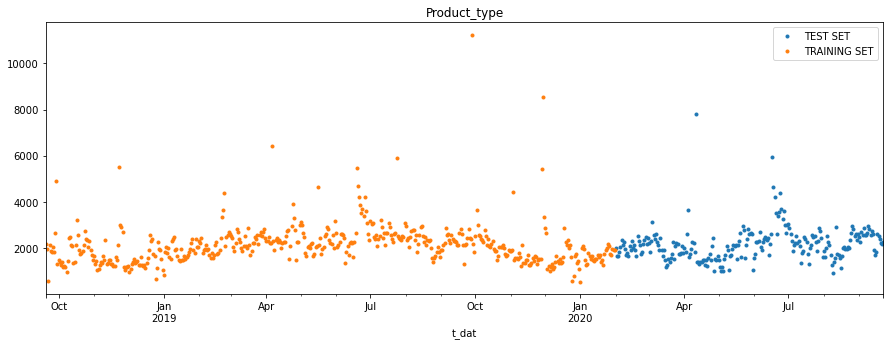

In [307]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='Top']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [308]:
#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-308-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-308-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


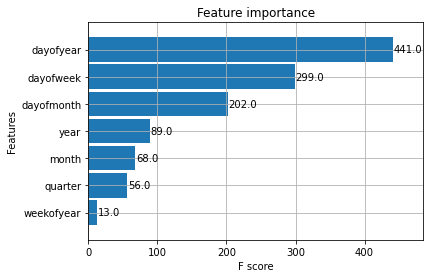

In [309]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

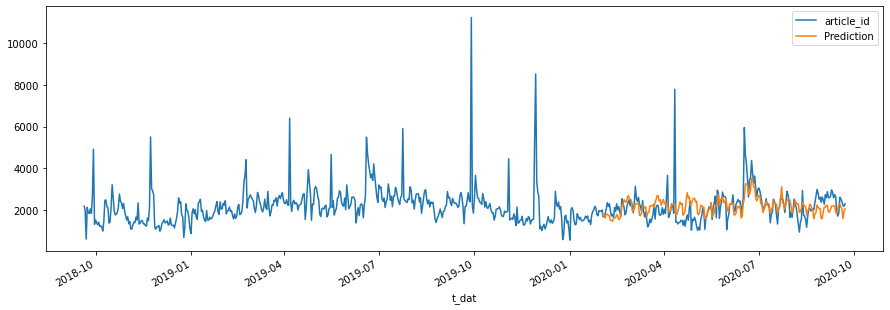

In [310]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

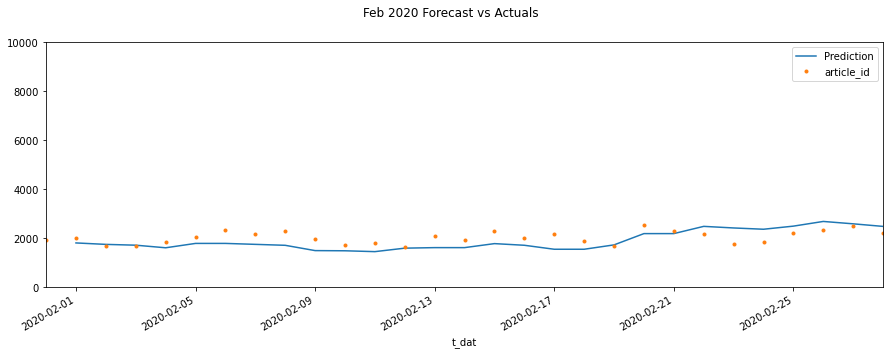

In [311]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

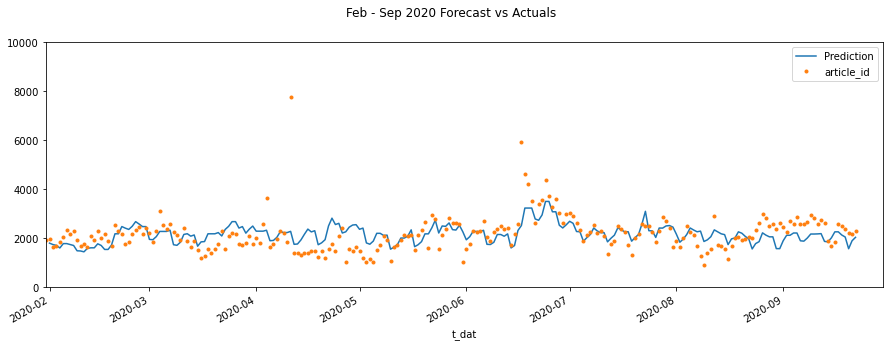

In [312]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [313]:
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

429284.12141198636
442.6754981507646
22.19966845073308


<ipython-input-369-6baeb6b51e81>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


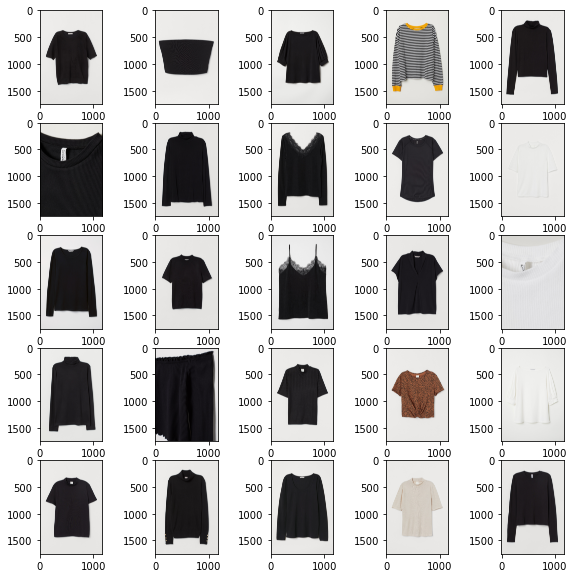

In [369]:
#ดู detail
df = tsat[tsat['product_type_name']=='Top']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()


plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

# Bra

            article_id
t_dat                 
2020-02-01        1996
2020-02-02        1800
2020-02-03        1819
2020-02-04        1777
2020-02-05        2087


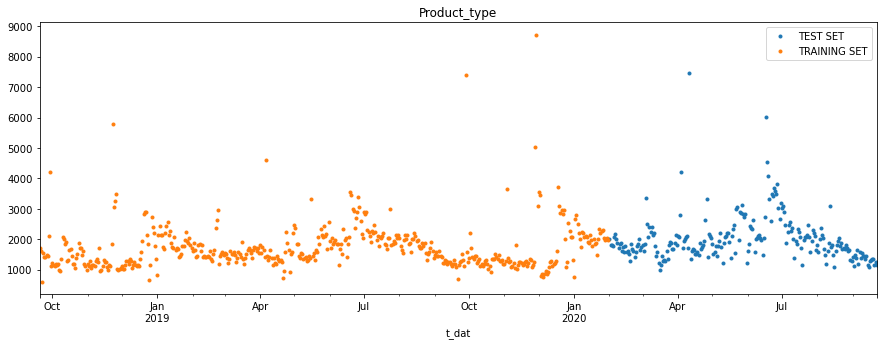

In [314]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='Bra']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [315]:
#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-315-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-315-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


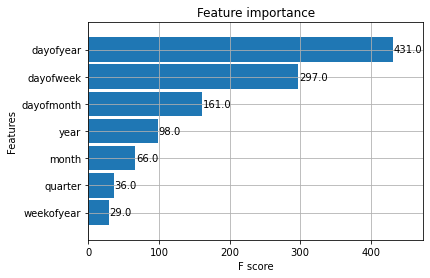

In [316]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

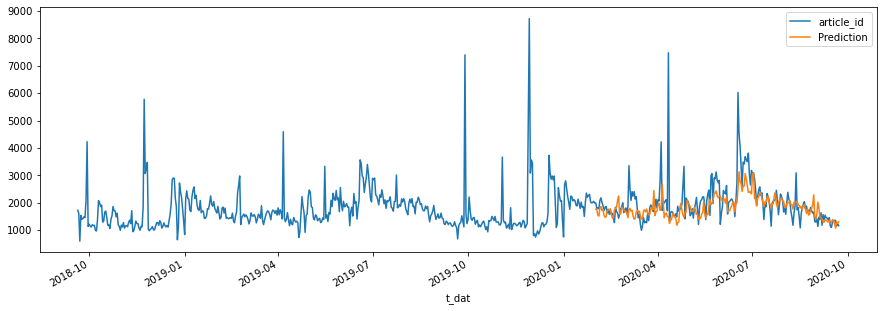

In [317]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

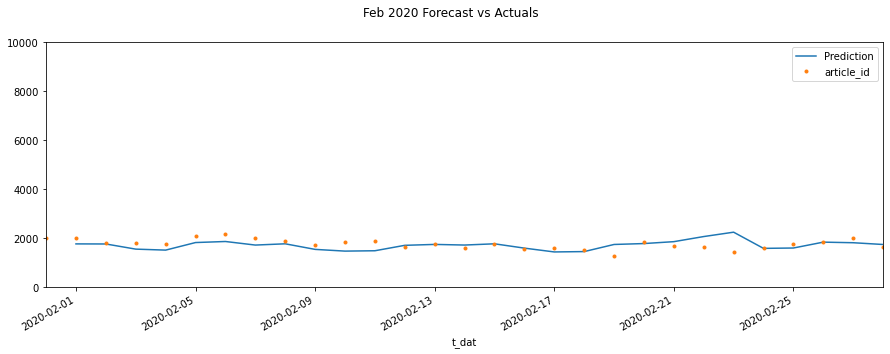

In [318]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

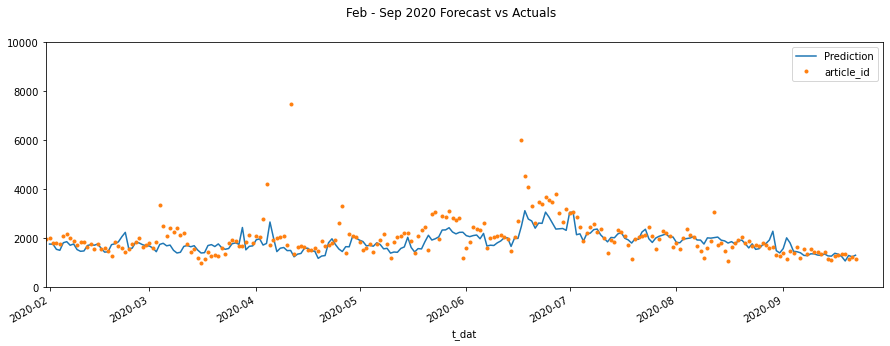

In [319]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [144]:
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

432050.2067299868
370.8569117769282
16.727744824852408


<ipython-input-370-87080e05ac58>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


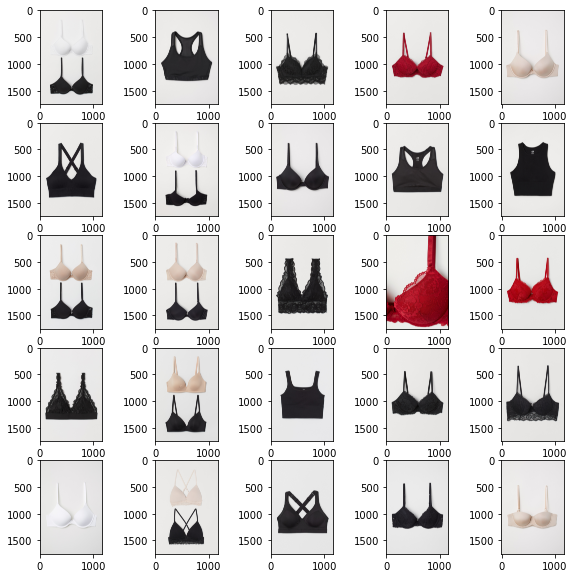

In [370]:
#ดู detail
df = tsat[tsat['product_type_name']=='Bra']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()


plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

# T-shirt

            article_id
t_dat                 
2020-02-01        2083
2020-02-02        1538
2020-02-03        1734
2020-02-04        1823
2020-02-05        1865


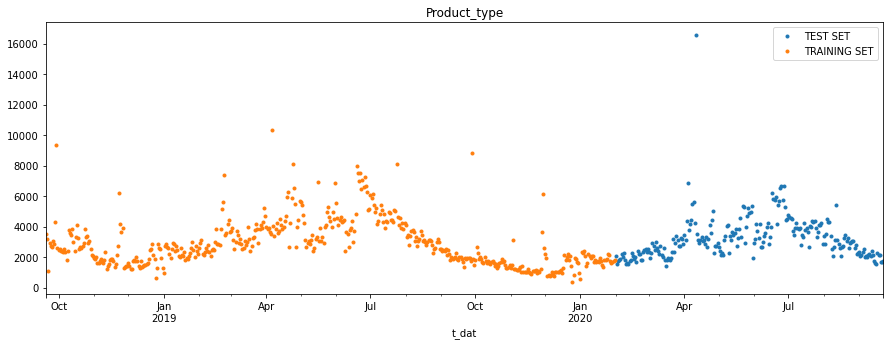

In [320]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='T-shirt']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [321]:
#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-321-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-321-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


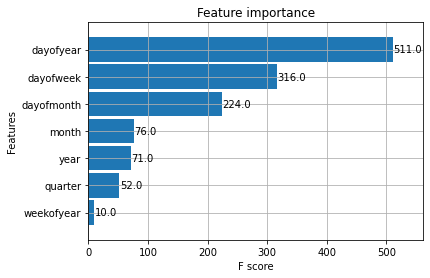

In [322]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

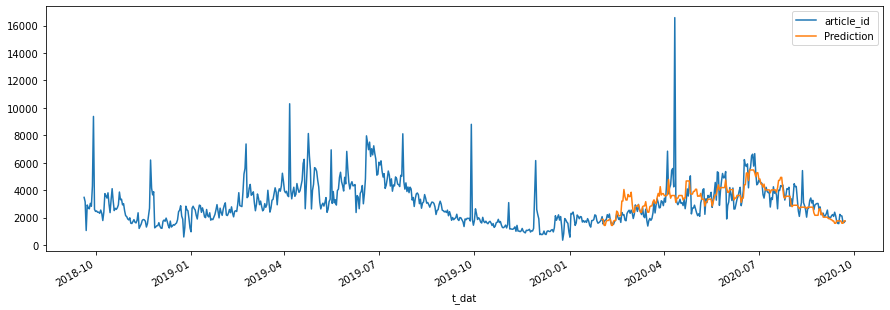

In [323]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

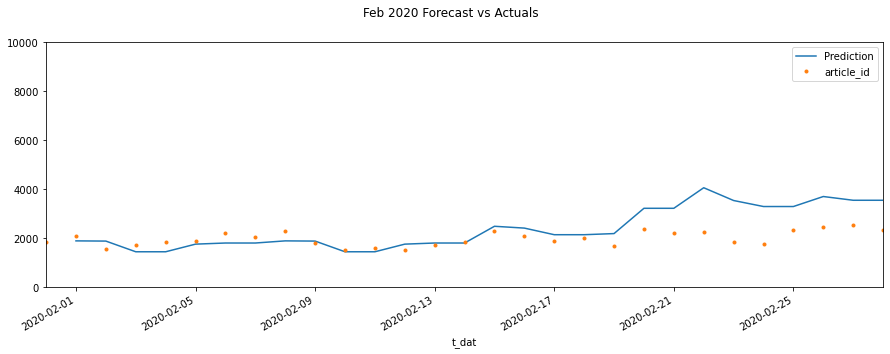

In [324]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

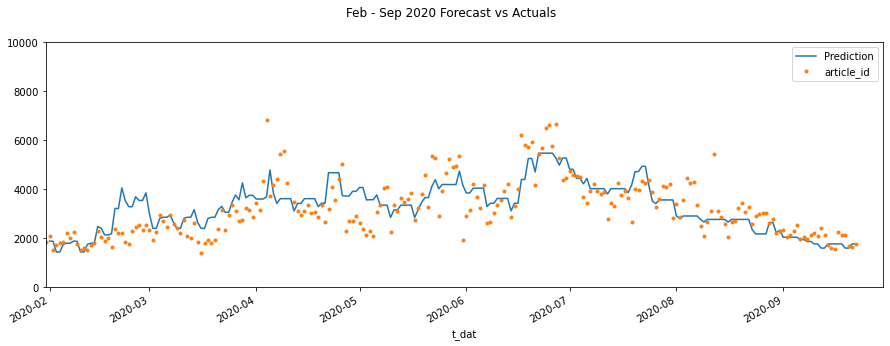

In [325]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [151]:
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

1304121.1977490666
631.9236219040891
19.70795068787371


<ipython-input-388-593e962ee8ef>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


IndexError: list index out of range

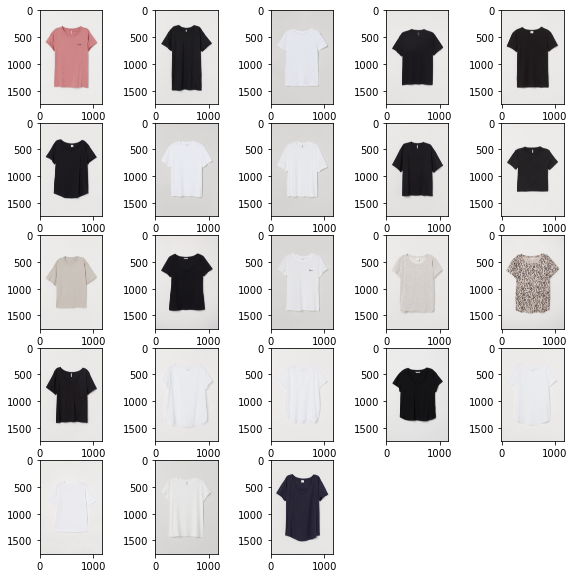

In [388]:
#ดู detail
df = tsat[tsat['product_type_name']=='T-shirt']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()
inflist.remove('0610776002.jpg') #เนื่องจากไม่มีข้อมูลในไฟล์รูป
inflist.remove('0610776001.jpg') #เนื่องจากไม่มีข้อมูลในไฟล์รูป
# inflist

plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

# Shorts

            article_id
t_dat                 
2020-02-01         285
2020-02-02         209
2020-02-03         296
2020-02-04         201
2020-02-05         296


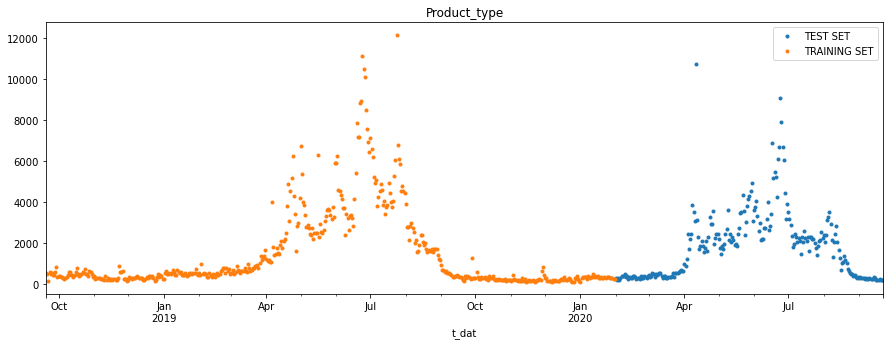

In [326]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='Shorts']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [327]:
#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-327-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-327-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


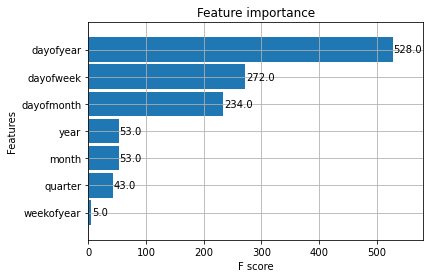

In [328]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

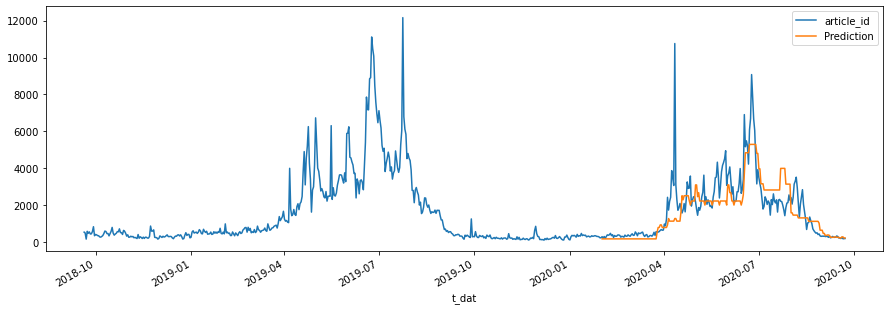

In [329]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

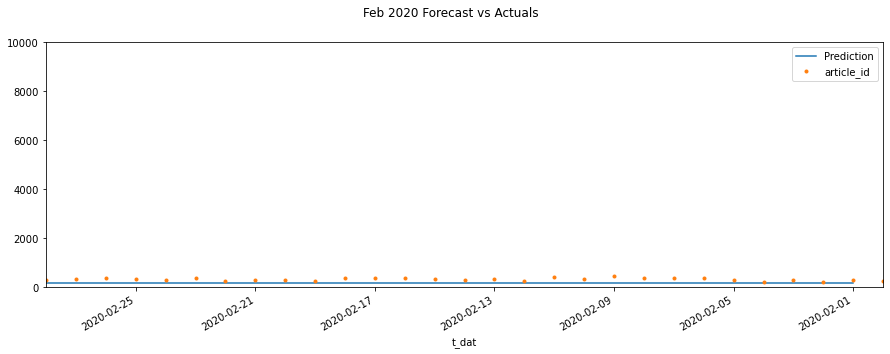

In [156]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

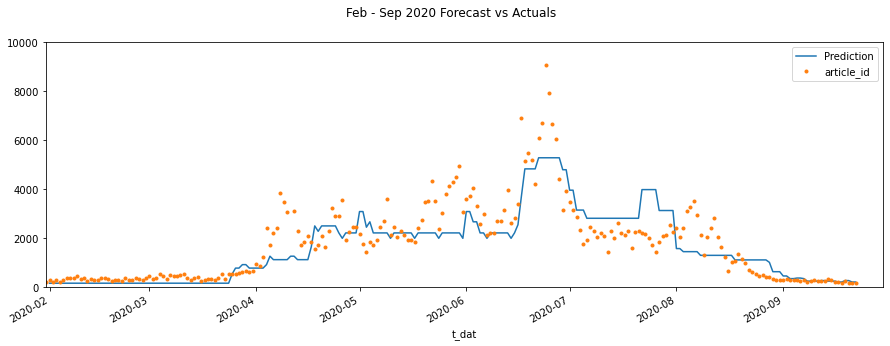

In [330]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [158]:
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

1206734.2188681078
661.2545331589719
39.94639772085429


<ipython-input-389-3e7ec53b6b76>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


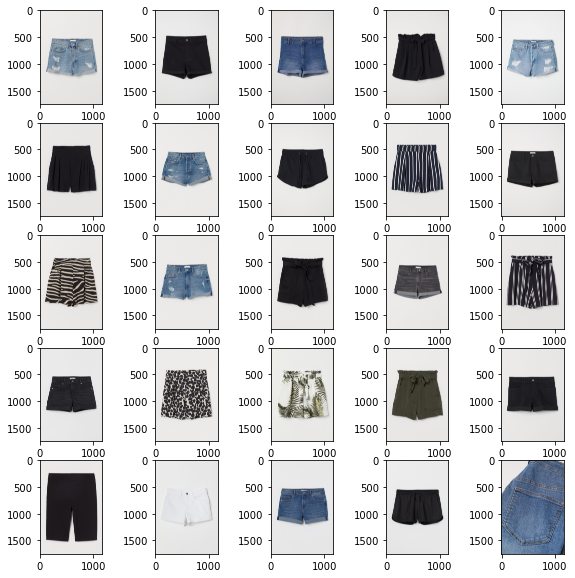

In [389]:
#ดู detail
df = tsat[tsat['product_type_name']=='Shorts']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()


plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

# Vest top

            article_id
t_dat                 
2020-02-01        1205
2020-02-02        1088
2020-02-03        1051
2020-02-04        1066
2020-02-05        1110


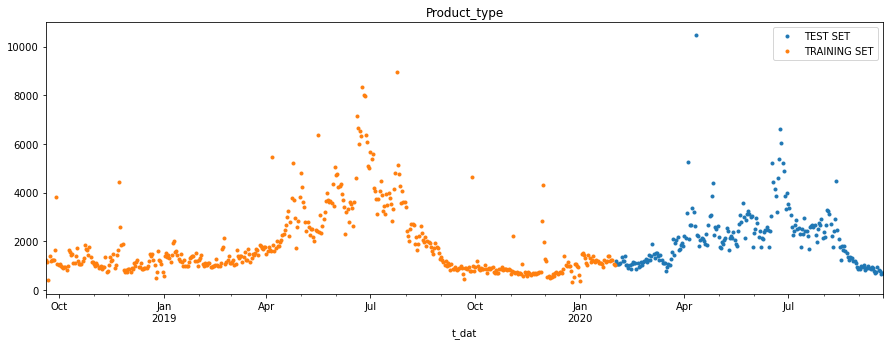

In [331]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='Vest top']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [332]:

#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-332-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-332-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


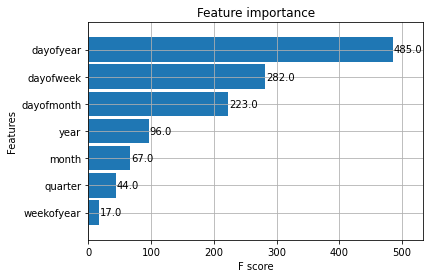

In [333]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

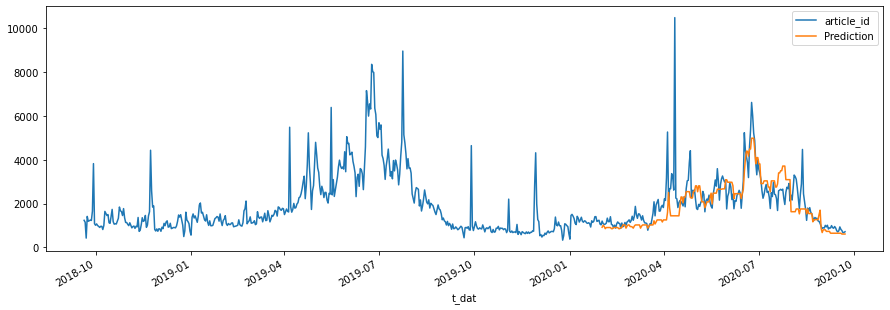

In [334]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

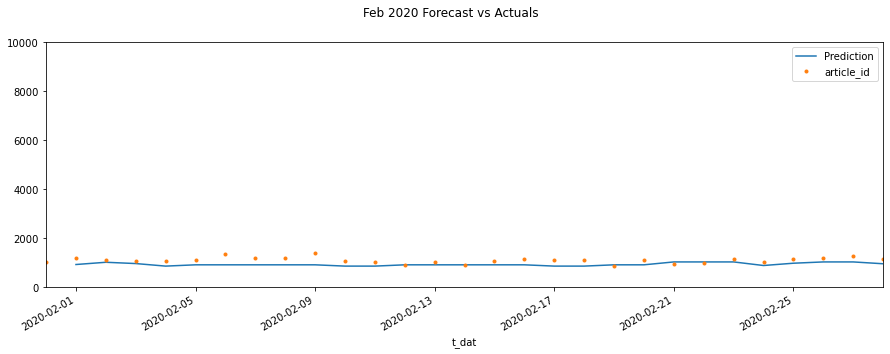

In [335]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

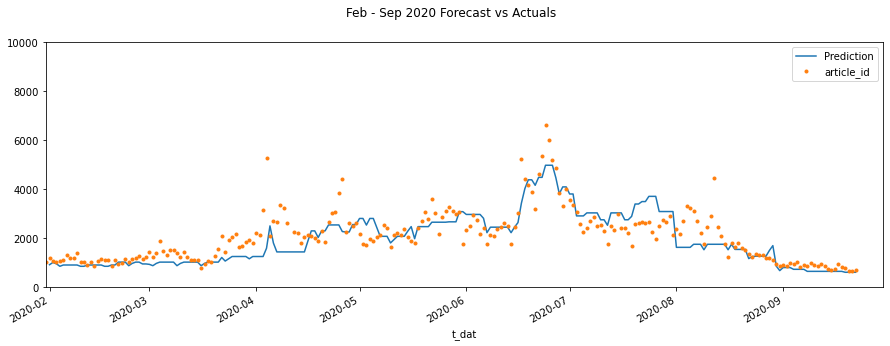

In [336]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [165]:
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

804307.1292309479
504.7764108211436
21.783347000714617


<ipython-input-391-1c2152b25238>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


KeyError: "There is no item named '0408875001.jpg' in the archive"

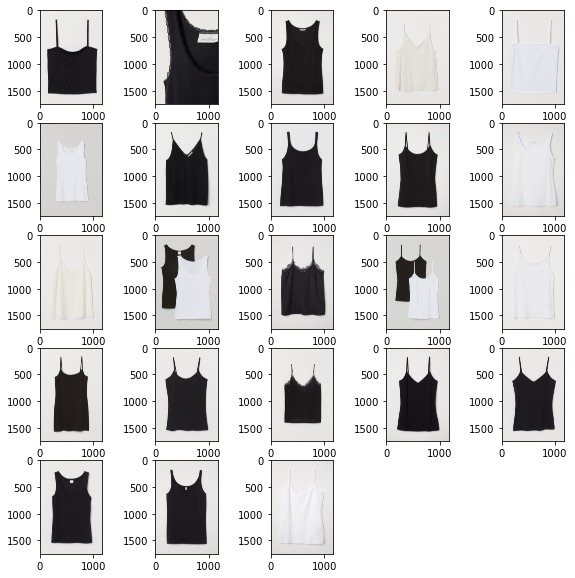

In [391]:
#ดู detail
df = tsat[tsat['product_type_name']=='Vest top']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()

plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

# Bikini top

            article_id
t_dat                 
2020-02-01         731
2020-02-02         953
2020-02-03         972
2020-02-04         903
2020-02-05         872


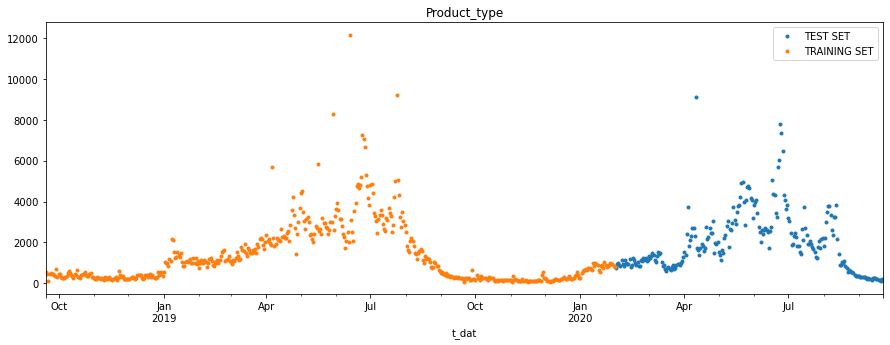

In [337]:
# train/test split ใช้ Feb to Sep 2020 เป็น test
split_date = '2020-01-31'
prodt_time = prodt_ts.copy()
prodt_time = prodt_time.reset_index()
prodt_ = prodt_time[prodt_time['product_type_name']=='Bikini top']
prodt_ = prodt_.set_index('t_dat')
prodt_ = prodt_.drop(['product_type_name'], axis=1)
prodt_train = prodt_.loc[prodt_.index <= split_date].copy()
prodt_test = prodt_.loc[prodt_.index > split_date].copy()
print(prodt_test.head())

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')

In [338]:
#Create Time Series Features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

create_features(df=prodt_test, label=None)

<ipython-input-338-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


<ipython-input-338-0fb63a59b375>:14: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


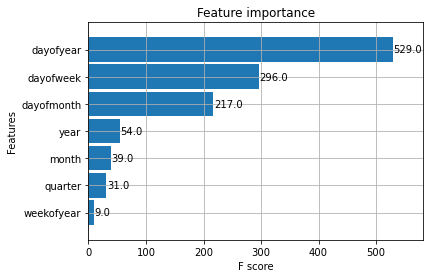

In [339]:
X_train, y_train = create_features(prodt_train, label='article_id')
X_test, y_test = create_features(prodt_test, label='article_id')

#Create XGBoost Model
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

_ = plot_importance(reg, height=0.9)

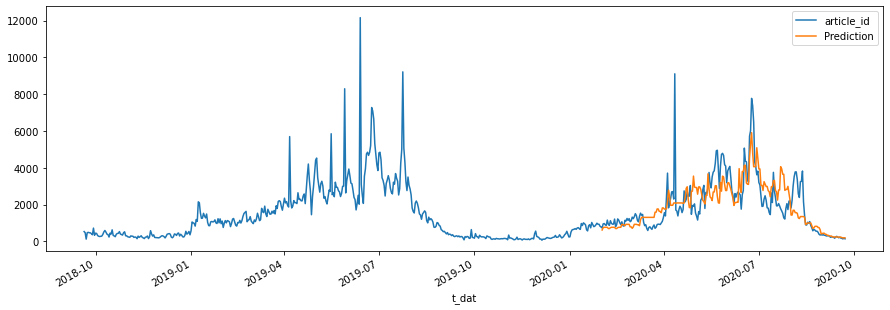

In [340]:
# Forecast on Test Set
prodt_test['Prediction'] = reg.predict(X_test)
prodt_all = pd.concat([prodt_test, prodt_train], sort=False)
p_ = prodt_all[['article_id','Prediction']].plot(figsize=(15, 5))

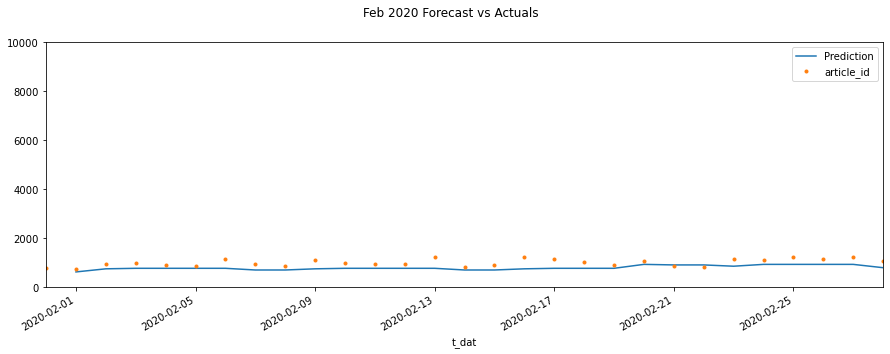

In [341]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

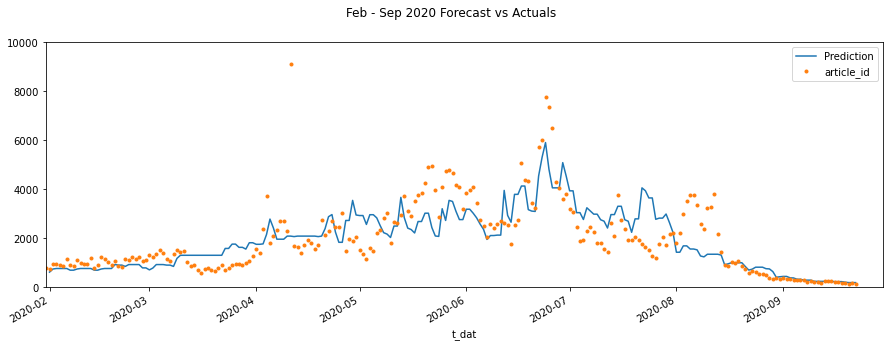

In [342]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
p_ = prodt_all[['Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 10000)
ax.invert_xaxis()
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [172]:
# Error Metrics On Test Set
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(mean_squared_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))
print(mean_absolute_percentage_error(y_true=prodt_test['article_id'],
                   y_pred=prodt_test['Prediction']))

975554.8906623208
673.898313806412
35.5502552518773


<ipython-input-392-274c98914e92>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))


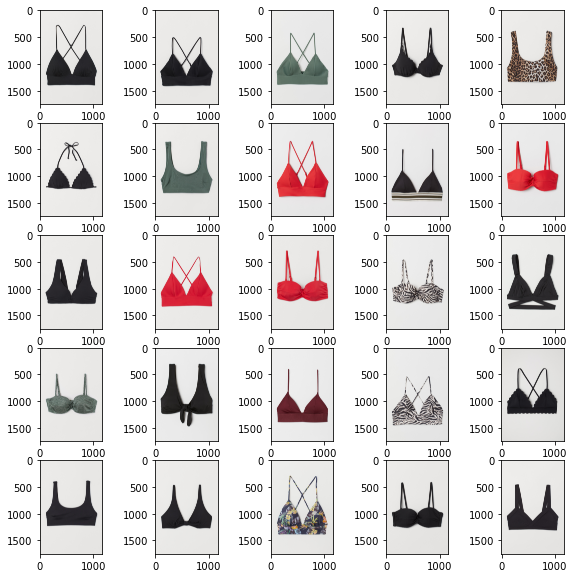

In [392]:
#ดู detail
df = tsat[tsat['product_type_name']=='Bikini top']
df = df.groupby(by=['year','month','article_id']).agg({'price': ['count','sum']})
df = df.reset_index()
df = df.sort_values([('price', 'count')], ascending=False)
df = df.set_axis(['year', 'month', 'article_id', 'items_count', 'income'], axis=1, inplace=False)
df = df.groupby(by=['article_id']).agg({'items_count': ['sum']})
df = df.reset_index()
df = df.sort_values([('items_count', 'sum')], ascending=False)
df_1st20 = df.iloc[0:25]
df_1st20['article_id'] = df_1st20['article_id'].apply(lambda x: "{}{}".format(x, '.jpg'))
inflist = df_1st20['article_id'].tolist()


plt.figure(figsize=(10,10))

for i in range(25):
    f = inflist[i]
    ifile = imgzip.open(f)
    img = Image.open(ifile)
    plt.subplot(5,5,i+1) 
    plt.imshow(img)
plt.show()

In [240]:
# ลอง model aim
#Exponentially Weighted Moving Average  (EMA)
df1 = prodt_ts.copy()
df1 = df1.reset_index()
df1 = df1[df1['product_type_name']=='Trousers']
df1 = df1.drop(columns=['product_type_name'])
df1 = df1.set_index('t_dat')

df1['EMA_False'] = df1.iloc[:,0].ewm(span=5,adjust=False).mean()
df1['EMA_True'] = df1.iloc[:,0].ewm(span=5).mean()
df1

,article_id,EMA_False,EMA_True
t_dat,,,
2018-09-20,8722,8722.000000,8722.000000
2018-09-21,8541,8661.666667,8613.400000
2018-09-22,3061,6794.777778,5983.315789
2018-09-23,10832,8140.518519,7997.384615
2018-09-24,8211,8164.012346,8079.388626
...,...,...,...
2020-09-18,6333,5671.994298,5671.994298
2020-09-19,5824,5722.662866,5722.662866
2020-09-20,5401,5615.441910,5615.441910


<AxesSubplot:xlabel='t_dat'>

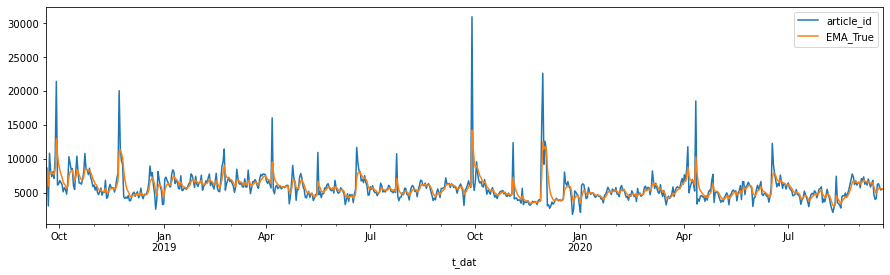

In [236]:
df1[['article_id','EMA_True']].plot(figsize=(15,4))

In [231]:
 mean_absolute_percentage_error(df1['article_id'],df1['EMA_True'])

12.186229537890188

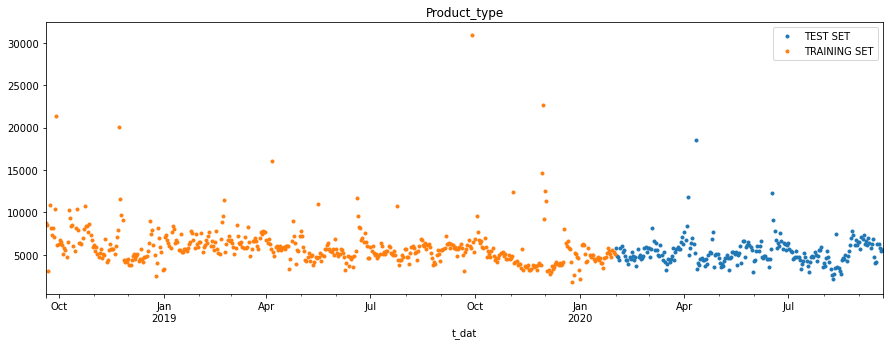

In [247]:
# ลอง model aim แบบแบ่ง train test
#Exponentially Weighted Moving Average  (EMA)
split_date = '2020-01-31'
df1 = prodt_ts.copy()
df1 = df1.reset_index()
df1 = df1[df1['product_type_name']=='Trousers']
df1 = df1.drop(columns=['product_type_name'])
df1 = df1.set_index('t_dat')
df1_train = df1.loc[df1.index <= split_date].copy()
df1_test = df1.loc[df1.index > split_date].copy()

_ = prodt_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prodt_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_type', style='.')



<AxesSubplot:xlabel='t_dat'>

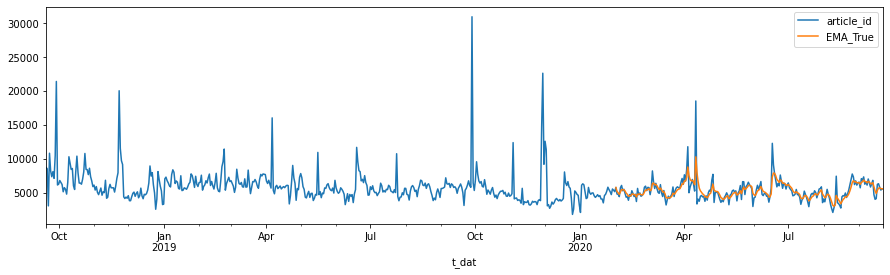

In [251]:
df1['EMA_False'] = df1_train.iloc[:,0].ewm(span=5,adjust=False).mean()
df1['EMA_True'] = df1_test.iloc[:,0].ewm(span=5).mean()
df1[['article_id','EMA_True']].plot(figsize=(15,4))

In [249]:
 mean_absolute_percentage_error(df1['article_id'],df1['EMA_True'])

nan